# Customer Churn Analysis and Prediction

| No. |      Feature Name               |   Description                                             |
| --- | :---------------------------- | :------------------------------------------------------- |
| 1.  | CustomerID                    | Unique customer identifier                                |
| 2.  | Churn                         | Churn Flag (Indicates the customer's churn status)        |
| 3.  | Tenure                        | Customer's tenure in the organization                    |
| 4.  | PreferredLoginDevice          | Customer's preferred login device                         |
| 5.  | CityTier                      | City tier level                                           |
| 6.  | WarehouseToHome               | Distance between customer's home and warehouse            |
| 7.  | PreferredPaymentMode          | Customer's preferred payment method                       |
| 8.  | Gender                        | Customer's gender                                         |
| 9.  | HourSpendOnApp                | Number of hours spent on the mobile app or website        |
| 10. | NumberOfDeviceRegistered      | Total number of devices registered by the customer        |
| 11. | PreferedOrderCat              | Preferred order category by the customer in the last month|
| 12. | SatisfactionScore             | Customer's satisfaction score with the service            |
| 13. | MaritalStatus                 | Customer's marital status                                 |
| 14. | NumberOfAddress               | Total number of addresses added for the customer          |
| 15. | Complain                      | Whether there has been any complaint in the last month    |
| 16. | OrderAmountHikeFromlastYear   | Percentage increase in order amount from the previous year|
| 17. | CouponUsed                    | Total number of coupons used in the last month            |
| 18. | OrderCount                    | Total number of orders placed in the last month           |
| 19. | DaySinceLastOrder             | Number of days since the customer's last order            |
| 20. | CashbackAmount                | Average cashback amount received by the customer          |


### Project Overview

    
Churn refers to the percentage of a company's customers who stop using its products or services.

Companies use churn analysis to strengthen their relationship with customers, increase satisfaction, and maintain revenue.

Acquiring new customers is more costly than retaining existing on</span>

In [84]:
# Model
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from xgboost import XGBClassifier
import xgboost as xgb
from sklearn import svm
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score

# Performance Evaluation
from sklearn import metrics
from sklearn.metrics import silhouette_samples,silhouette_score,roc_auc_score,roc_curve,confusion_matrix,classification_report
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, jaccard_score, log_loss


# Clustering
from scipy.cluster.hierarchy import linkage,fcluster
from sklearn.cluster import KMeans 

# Data Preprocessing
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
%matplotlib inline

### Package Versions
* python : 3.11.4 
* sklearn : 0.12.2
* xgboost : 1.7.4
* pandas : 2.0.3
* numpy : 1.24.4
* seaborn : 0.12.2
* matplotlib : 3.7.2
  

In [5]:
data = pd.read_csv('data.csv')    # We imported the data from the 'data.csv' file with the same name.

In [6]:
df = pd.DataFrame(data)     # Let's create a DataFrame named 'df' from the imported data. 
                            # We will perform some operations on 'df' for a while. Let the original data remain in 'data'.
df1 = df.copy()             # To preserve the original data, we make a copy.


In [7]:
df.head()  # Check the first 5 rows for a quick overview of the dataset.


,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,50001,1,4.0,Mobile Phone,3,6.0,Debit Card,Female,3.0,3,Laptop & Accessory,2,Single,9,1,11.0,1.0,1.0,5.0,160
1,50002,1,NaN,Phone,1,8.0,UPI,Male,3.0,4,Mobile,3,Single,7,1,15.0,0.0,1.0,0.0,121
2,50003,1,NaN,Phone,1,30.0,Debit Card,Male,2.0,4,Mobile,3,Single,6,1,14.0,0.0,1.0,3.0,120
3,50004,1,0.0,Phone,3,15.0,Debit Card,Male,2.0,4,Laptop & Accessory,5,Single,8,0,23.0,0.0,1.0,3.0,134
4,50005,1,0.0,Phone,1,12.0,CC,Male,NaN,3,Mobile,5,Single,3,0,11.0,1.0,1.0,3.0,130


## Exploratory Data Analysis (EDA) - Examining and Understanding the Dataset

In this section, we will perform various analyses and visualizations to obtain essential information about the dataset and draw meaningful insights. The goal of EDA is to explore and understand the structure, features, missing and outlier values, relationships, distributions, and some statistical characteristics of the dataset.

During the EDA process, we will examine the dataset's structure, properties, missing and outlier values, relationships, distributions, and some statistical characteristics to discover correlations, trends, and patterns. This will help us identify important features and gain insights into the dataset.


In [8]:
df.shape    # Let's check the dimensions of our dataset.
            # We have a dataset with 5630 rows and 20 features (columns).

(5630, 20)

In [9]:
df.info()    # Let's have a general overview of the dataset. We can see the variables, data types, and the distribution of missing values.
             # Except for some missing values, there doesn't seem to be any abnormality.
             # We can say that the features with the data type "object" represent categorical variables.


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5630 entries, 0 to 5629
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   CustomerID                   5630 non-null   int64  
 1   Churn                        5630 non-null   int64  
 2   Tenure                       5366 non-null   float64
 3   PreferredLoginDevice         5630 non-null   object 
 4   CityTier                     5630 non-null   int64  
 5   WarehouseToHome              5379 non-null   float64
 6   PreferredPaymentMode         5630 non-null   object 
 7   Gender                       5630 non-null   object 
 8   HourSpendOnApp               5375 non-null   float64
 9   NumberOfDeviceRegistered     5630 non-null   int64  
 10  PreferedOrderCat             5630 non-null   object 
 11  SatisfactionScore            5630 non-null   int64  
 12  MaritalStatus                5630 non-null   object 
 13  NumberOfAddress   

In [12]:
# Let's find the unique values and frequencies of categorical variables
# The value_counts() method finds the unique values and their counts (freq).
# We can observe the distribution of unique values, which values are common, and any class imbalances.
# When looking at the results, we can see differences between some values.
# But there doesn't appear to be any abnormal imbalance or discrepancy.

for feature in df[:-1]:
    if df[feature].dtypes == 'O':             # Check columns with the object data type.
        print(f"Unique Values and Frequencies of {feature}:\n{df[feature].value_counts()}\n")


Unique Values and Frequencies of PreferredLoginDevice:
PreferredLoginDevice
Mobile Phone    2765
Computer        1634
Phone           1231
Name: count, dtype: int64

Unique Values and Frequencies of PreferredPaymentMode:
PreferredPaymentMode
Debit Card          2314
Credit Card         1501
E wallet             614
UPI                  414
COD                  365
CC                   273
Cash on Delivery     149
Name: count, dtype: int64

Unique Values and Frequencies of Gender:
Gender
Male      3384
Female    2246
Name: count, dtype: int64

Unique Values and Frequencies of PreferedOrderCat:
PreferedOrderCat
Laptop & Accessory    2050
Mobile Phone          1271
Fashion                826
Mobile                 809
Grocery                410
Others                 264
Name: count, dtype: int64

Unique Values and Frequencies of MaritalStatus:
MaritalStatus
Married     2986
Single      1796
Divorced     848
Name: count, dtype: int64



In [13]:
# Additionally, as we know from the description of the features,
# Churn, CityTier, and Complain are numerical variables but they are categorical in nature.

print(df['CityTier'].value_counts())      
print(df['Churn'].value_counts())
print(df['Complain'].value_counts())

# Let's convert these features to object type
df = df.astype({'CityTier': 'O', 'Churn': 'O', 'Complain': 'O'})



CityTier
1    3666
3    1722
2     242
Name: count, dtype: int64
Churn
0    4682
1     948
Name: count, dtype: int64
Complain
0    4026
1    1604
Name: count, dtype: int64


In [14]:
# Let's remove the 'CustomerID' column from the dataset as we won't be performing any specific analysis for individual users. 
# It becomes an unnecessary column.
df.drop(['CustomerID'],axis = 1,inplace = True)

# Let's store the column names of numerical and categorical features in separate lists.
num_features = [col for col in df.columns if df[col].dtype in ['int64', 'float64']]
cat_features = [col for col in df.columns if df[col].dtype in ['object']]
print('Numerical Features : \n ' , num_features)
print('Catagorical Features : \n ' , cat_features )

Numerical Features : 
  ['Tenure', 'WarehouseToHome', 'HourSpendOnApp', 'NumberOfDeviceRegistered', 'SatisfactionScore', 'NumberOfAddress', 'OrderAmountHikeFromlastYear', 'CouponUsed', 'OrderCount', 'DaySinceLastOrder', 'CashbackAmount']
Catagorical Features : 
  ['Churn', 'PreferredLoginDevice', 'CityTier', 'PreferredPaymentMode', 'Gender', 'PreferedOrderCat', 'MaritalStatus', 'Complain']


In [15]:
# Let's verify the operation we performed above.
df.dtypes

Churn                           object
Tenure                         float64
PreferredLoginDevice            object
CityTier                        object
WarehouseToHome                float64
PreferredPaymentMode            object
Gender                          object
HourSpendOnApp                 float64
NumberOfDeviceRegistered         int64
PreferedOrderCat                object
SatisfactionScore                int64
MaritalStatus                   object
NumberOfAddress                  int64
Complain                        object
OrderAmountHikeFromlastYear    float64
CouponUsed                     float64
OrderCount                     float64
DaySinceLastOrder              float64
CashbackAmount                   int64
dtype: object

### Reviewing Missing Values

In [16]:
df.isnull().sum()    # Let's check for missing values. Currently, it doesn't seem like we have any significant missing data.


Churn                            0
Tenure                         264
PreferredLoginDevice             0
CityTier                         0
WarehouseToHome                251
PreferredPaymentMode             0
Gender                           0
HourSpendOnApp                 255
NumberOfDeviceRegistered         0
PreferedOrderCat                 0
SatisfactionScore                0
MaritalStatus                    0
NumberOfAddress                  0
Complain                         0
OrderAmountHikeFromlastYear    265
CouponUsed                     256
OrderCount                     258
DaySinceLastOrder              307
CashbackAmount                   0
dtype: int64

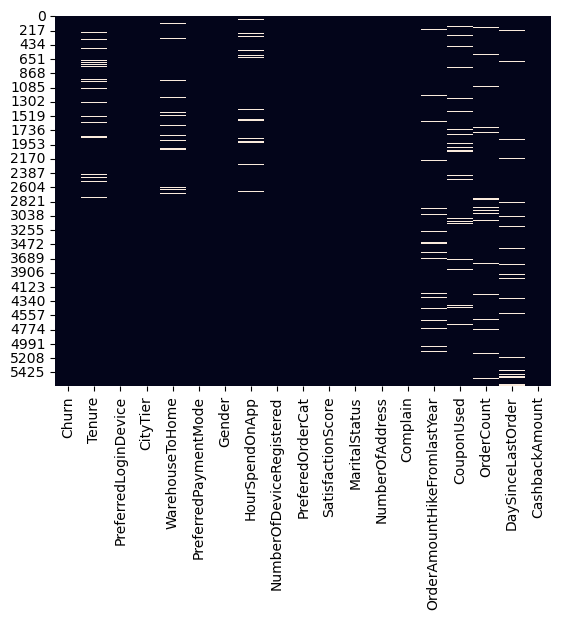

In [17]:
# Let's examine whether missing values are concentrated in specific regions or columns.
# Approximately half of the features have missing values, and there is roughly an equal number of missing values across all features.
# All missing values are present in numerical variables, which is good in terms of data consistency. 
# Additionally, there doesn't seem to be any significant concentration or pattern in the distribution of missing values that raises concerns or questions.

sns.heatmap(df.isnull(), cbar = False)  
plt.show() 


           





In [19]:
# Let's print out more detailed information to gain further insights.
# Upon examining the results, we can see that filling the missing values with the mean or median values of the columns would yield a quick and effective result.
# All columns are numerical, and we observe that there is approximately 4% of missing data per column.
for feature in df.columns:
    if df[feature].isnull().any():       # Check if there are any missing values in the column
        print(feature.title(),'\n')
        print(f'Total Values in {feature}: {len(df[feature])}')
        print(f'NaN Values in {feature}: {df[feature].isnull().sum()}')
        print(f'Non-null Values in {feature}: {df[feature].notnull().sum()}')
        print(f'Data Type of {feature}: {df[feature].dtypes}', '\n')


Tenure 

Total Values in Tenure: 5630
NaN Values in Tenure: 264
Non-null Values in Tenure: 5366
Data Type of Tenure: float64 

Warehousetohome 

Total Values in WarehouseToHome: 5630
NaN Values in WarehouseToHome: 251
Non-null Values in WarehouseToHome: 5379
Data Type of WarehouseToHome: float64 

Hourspendonapp 

Total Values in HourSpendOnApp: 5630
NaN Values in HourSpendOnApp: 255
Non-null Values in HourSpendOnApp: 5375
Data Type of HourSpendOnApp: float64 

Orderamounthikefromlastyear 

Total Values in OrderAmountHikeFromlastYear: 5630
NaN Values in OrderAmountHikeFromlastYear: 265
Non-null Values in OrderAmountHikeFromlastYear: 5365
Data Type of OrderAmountHikeFromlastYear: float64 

Couponused 

Total Values in CouponUsed: 5630
NaN Values in CouponUsed: 256
Non-null Values in CouponUsed: 5374
Data Type of CouponUsed: float64 

Ordercount 

Total Values in OrderCount: 5630
NaN Values in OrderCount: 258
Non-null Values in OrderCount: 5372
Data Type of OrderCount: float64 

Daysince

### Handling Missing Values

In [20]:
for feature in df[:-1]:
    if df[feature].isnull().any() == True and df[feature].dtypes == 'float64':
        df[feature].fillna(value = df[feature].median(), inplace = True)

In [21]:
df.isnull().sum()

Churn                          0
Tenure                         0
PreferredLoginDevice           0
CityTier                       0
WarehouseToHome                0
PreferredPaymentMode           0
Gender                         0
HourSpendOnApp                 0
NumberOfDeviceRegistered       0
PreferedOrderCat               0
SatisfactionScore              0
MaritalStatus                  0
NumberOfAddress                0
Complain                       0
OrderAmountHikeFromlastYear    0
CouponUsed                     0
OrderCount                     0
DaySinceLastOrder              0
CashbackAmount                 0
dtype: int64

### Outlier Detection

In [24]:
# Visualize outliers using box plots
def boxplot_maker(features):
    # Prepare the space for our 3x4 box plots. We will draw a total of 11 plots.
    fig, axes = plt.subplots(3, 4, figsize=(12, 9))

    # Iterate over features and assign them to the corresponding plot using i as the index
    for i, feature in enumerate(features):
        row = i // 4                  # Row index: Integer division to determine the row. For example, when i = 5, row = 1; when i = 3, row = 0.
        col = i % 4                   # Column index: Remainder of division to determine the column. For example, when i = 5, col = 1; when i = 4, col = 0.

        ax = axes[row, col]  # Represent the respective cell in the subplot

        sns.boxplot(data=df, y=feature, notch=True, showcaps=True, flierprops={'marker': 'x'},
                    boxprops={"facecolor": (.4, .6, .8, .5)}, medianprops={"color": "coral"}, ax=ax)

        ax.set_title(feature)  # Set title for the cells (Column names)
        ax.set_ylabel('')      # Clear the Y-axis label for a cleaner look
        ax.set_xlabel('')      # Similarly, for X-axis

    plt.tight_layout()         # Ensure the plots fit neatly into the cells
    plt.show()


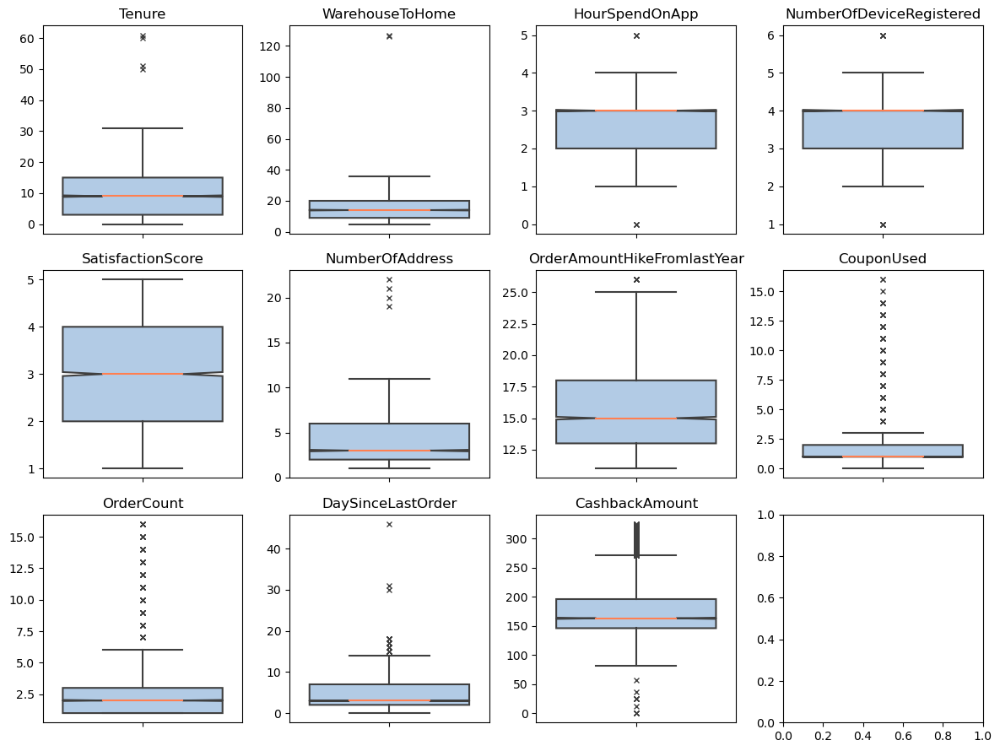

In [25]:
boxplot_maker(num_features)

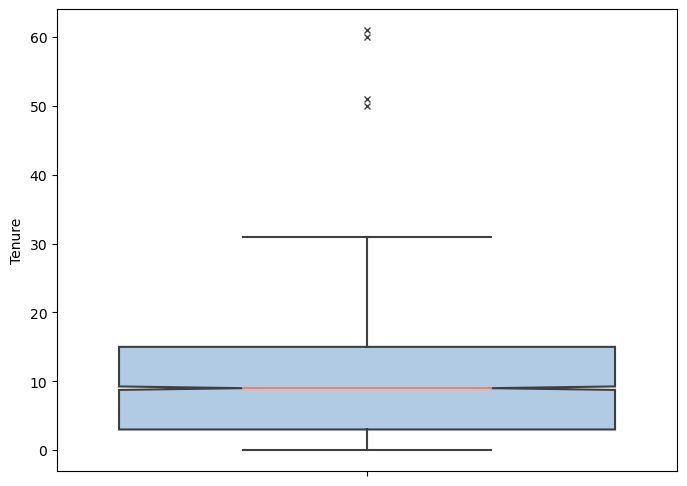

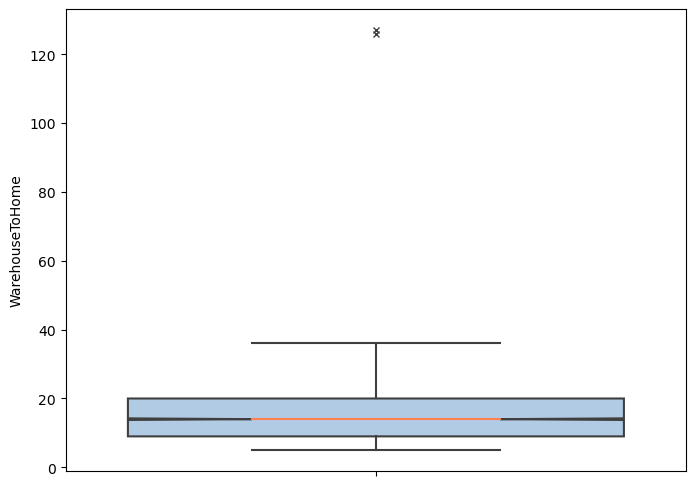

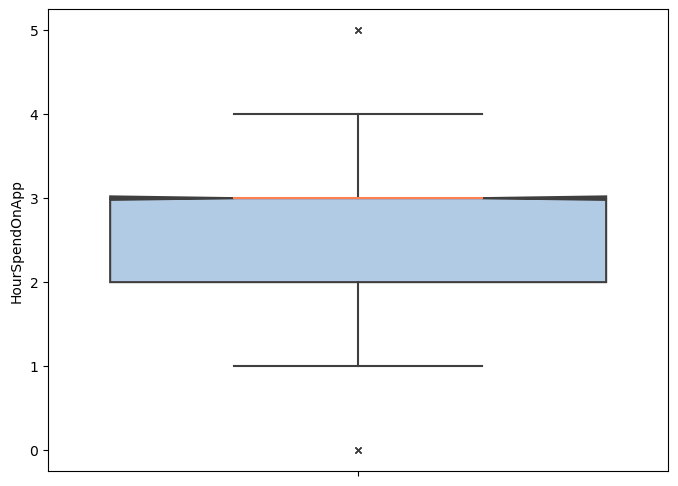

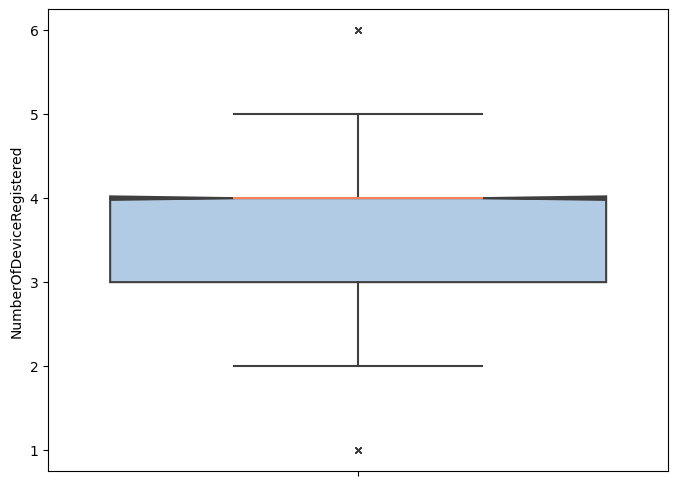

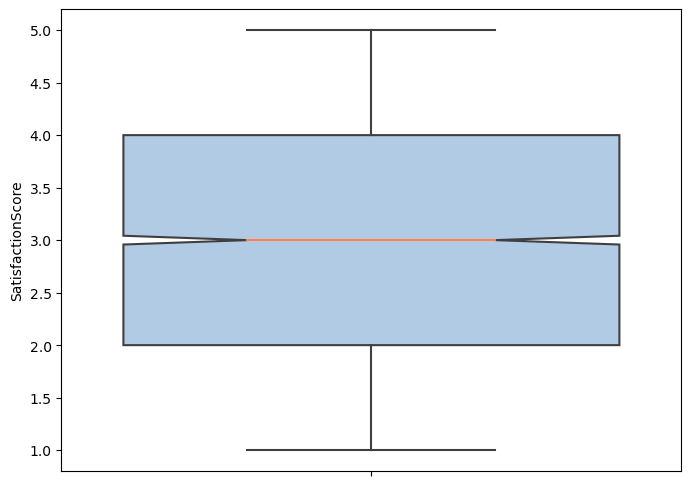

...

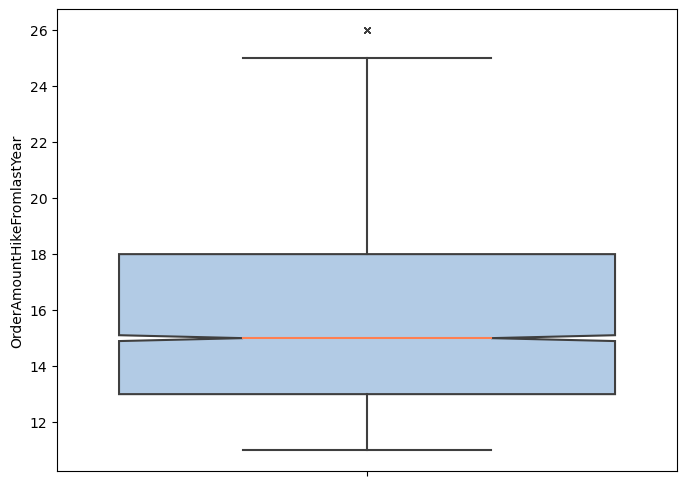

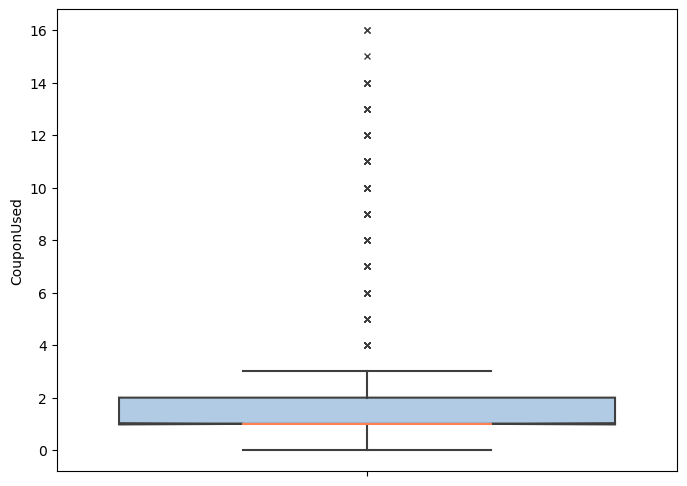

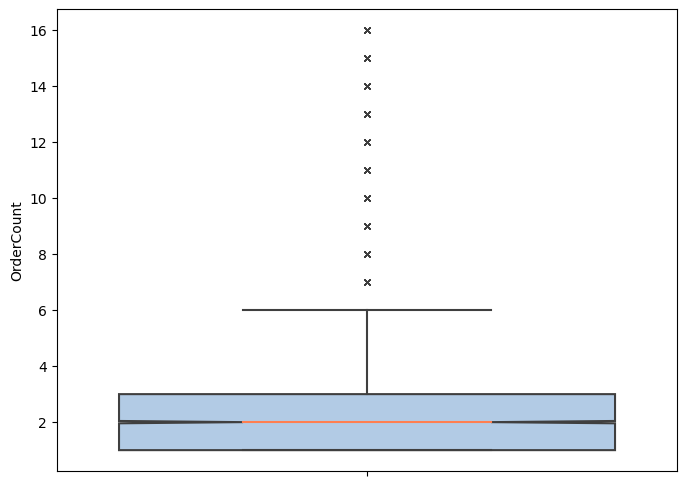

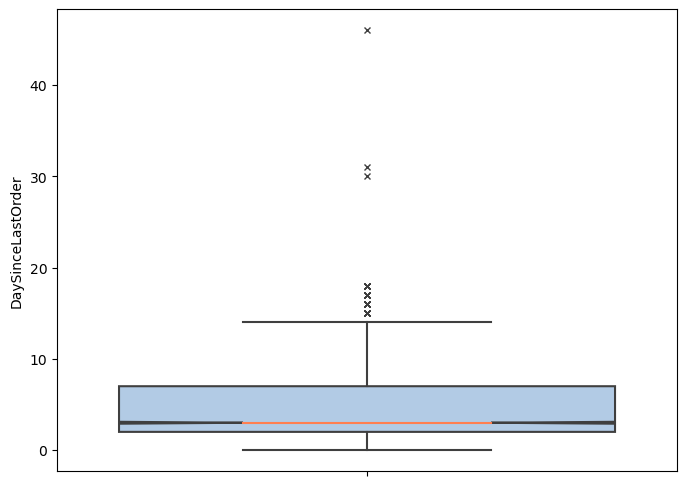

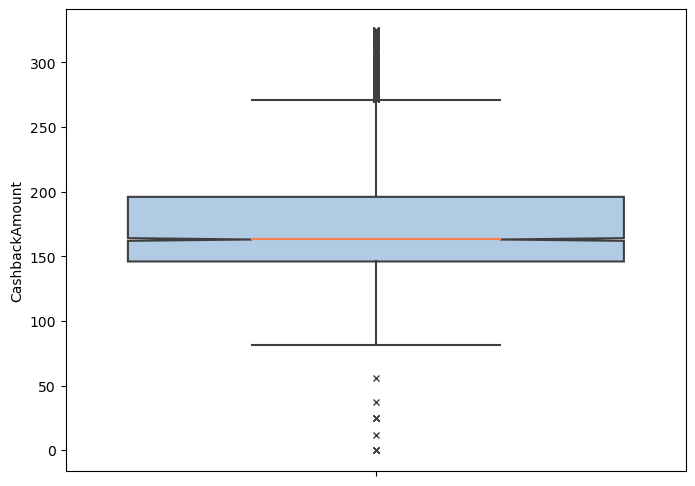

In [224]:
# If we want to look at it in more detail

for feature in df[sayisallar]:   
    plt.figure(figsize=(8,6))
    sns.boxplot(data=df,y=feature,notch=True,showcaps=True,flierprops={'marker':'x'}
                   ,boxprops={"facecolor": (.4, .6, .8, .5)}
                   ,medianprops={"color": "coral"},orient='v')
    plt.show()


### Outlier Treatment

In [27]:
def outlier_modifier(df, feature):
    Q1 = df[feature].quantile(0.25)
    Q3 = df[feature].quantile(0.75)
    IQR = Q3 - Q1

    low_bound = Q1 - 1.5 * IQR
    upp_bound = Q3 + 1.5 * IQR

    low_out = df[feature] < low_bound
    upp_out = df[feature] > upp_bound

    df.loc[low_out, feature] = Q1
    df.loc[upp_out, feature] = Q3

    return df




In [28]:
for feature in df.select_dtypes(include=[np.number]).columns:
    df = outlier_modifier(df, feature)


In [227]:
'''
from scipy.stats import zscore

def zscore_outlier(df, feature, z_threshold=2.5):
    # Cal Z-scores
    z_skoru = zscore(df[feature])
    
    # Aykırı değerleri belirle
    low_out = z_score  > z_threshold
    upp_out = z_score  < -z_threshold
    
    # Outliers Treat ( Q3 and Q1 were used in this ex. )
    Q3 = df[feature].quantile(0.75)
    Q1 = df[feature].quantile(0.25)

    df.loc[upp_out, feature] = Q3
    df.loc[low_out, feature] = Q1
    
    return df

for feature in df.select_dtypes(include=[np.number]).columns:
    df = zscore_outlier(df, feature)
'''

'\nfrom scipy.stats import zscore\n\ndef zscore_outlier(df, feature, z_threshold=2.5):\n    # Z skorlarını hesapla\n    z_skoru = zscore(df[feature])\n    \n    # Aykırı değerleri belirle\n    alt_outliers = z_skoru > z_threshold\n    ust_outliers = z_skoru < -z_threshold\n    \n    # Aykırı değerleri doldur (bu örnekte Q3 ve Q1 kullanıldı)\n    Q3 = df[feature].quantile(0.75)\n    Q1 = df[feature].quantile(0.25)\n\n    df.loc[ust_outliers, feature] = Q3\n    df.loc[alt_outliers, feature] = Q1\n    \n    return df\n\nfor feature in df.select_dtypes(include=[np.number]).columns:\n    df = zscore_outlier(df, feature)\n'

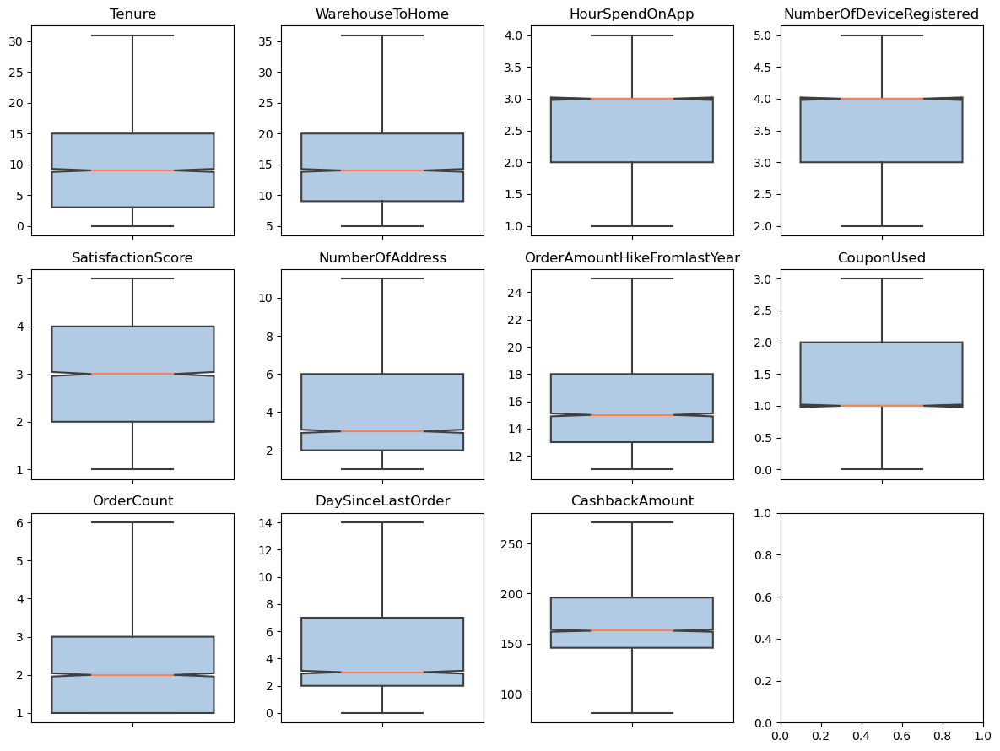

In [29]:
boxplot_maker(num_features)

In [30]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Tenure,5630.0,10.105329,8.269881,0.0,3.0,9.0,15.0,31.0
WarehouseToHome,5630.0,15.528952,8.080106,5.0,9.0,14.0,20.0,36.0
HourSpendOnApp,5630.0,2.934636,0.700981,1.0,2.0,3.0,3.0,4.0
NumberOfDeviceRegistered,5630.0,3.714920,0.784175,2.0,3.0,4.0,4.0,5.0
SatisfactionScore,5630.0,3.066785,1.380194,1.0,2.0,3.0,4.0,5.0
NumberOfAddress,5630.0,4.203730,2.547098,1.0,2.0,3.0,6.0,11.0
OrderAmountHikeFromlastYear,5630.0,15.627709,3.507160,11.0,13.0,15.0,18.0,25.0
CouponUsed,5630.0,1.272824,0.824968,0.0,1.0,1.0,2.0,3.0
OrderCount,5630.0,2.146004,1.142066,1.0,1.0,2.0,3.0,6.0
DaySinceLastOrder,5630.0,4.346536,3.282812,0.0,2.0,3.0,7.0,14.0


### New Features

In [230]:
# We could have calculated the average number of orders per time unit using the variable Ort_OrderCount between Tenure and OrderCount.
# However, there are around 700 0 values in Tenure, and dividing by 0 would result in an error.
# Changing the 0 values to 1 would alter around 20% of the column, so we decided not to do it.
# Instead, we can calculate the cashback per order using CashbackAmount and OrderCount.

In [31]:
df['Avg_cashback_per_order'] = df['CashbackAmount'] / df['OrderCount']

In [32]:
df['Avg_cashback_per_order']

0       160.0
1       121.0
2       120.0
3       134.0
4       130.0
        ...  
5625     75.5
5626    112.5
5627     93.0
5628     89.5
5629     84.5
Name: Avg_cashback_per_order, Length: 5630, dtype: float64

In [33]:
num_features.append('Avg_cashback_per_order')

In [36]:
# What percentage of current customers are in churn
churn_true = df[df['Churn'] == 1]['Churn'].count()
churn_false = df[df['Churn'] == 0]['Churn'].count()
churn_perc = churn_true*100 / churn_false

In [37]:
churn_perc

20.24775736864588

### Visualizations and Analysis


In [38]:
for feature in cat_features:
    print(feature, '\n')
    print(df[feature].value_counts())

Churn 

Churn
0    4682
1     948
Name: count, dtype: int64
PreferredLoginDevice 

PreferredLoginDevice
Mobile Phone    2765
Computer        1634
Phone           1231
Name: count, dtype: int64
CityTier 

CityTier
1    3666
3    1722
2     242
Name: count, dtype: int64
PreferredPaymentMode 

PreferredPaymentMode
Debit Card          2314
Credit Card         1501
E wallet             614
UPI                  414
COD                  365
CC                   273
Cash on Delivery     149
Name: count, dtype: int64
Gender 

Gender
Male      3384
Female    2246
Name: count, dtype: int64
PreferedOrderCat 

PreferedOrderCat
Laptop & Accessory    2050
Mobile Phone          1271
Fashion                826
Mobile                 809
Grocery                410
Others                 264
Name: count, dtype: int64
MaritalStatus 

MaritalStatus
Married     2986
Single      1796
Divorced     848
Name: count, dtype: int64
Complain 

Complain
0    4026
1    1604
Name: count, dtype: int64


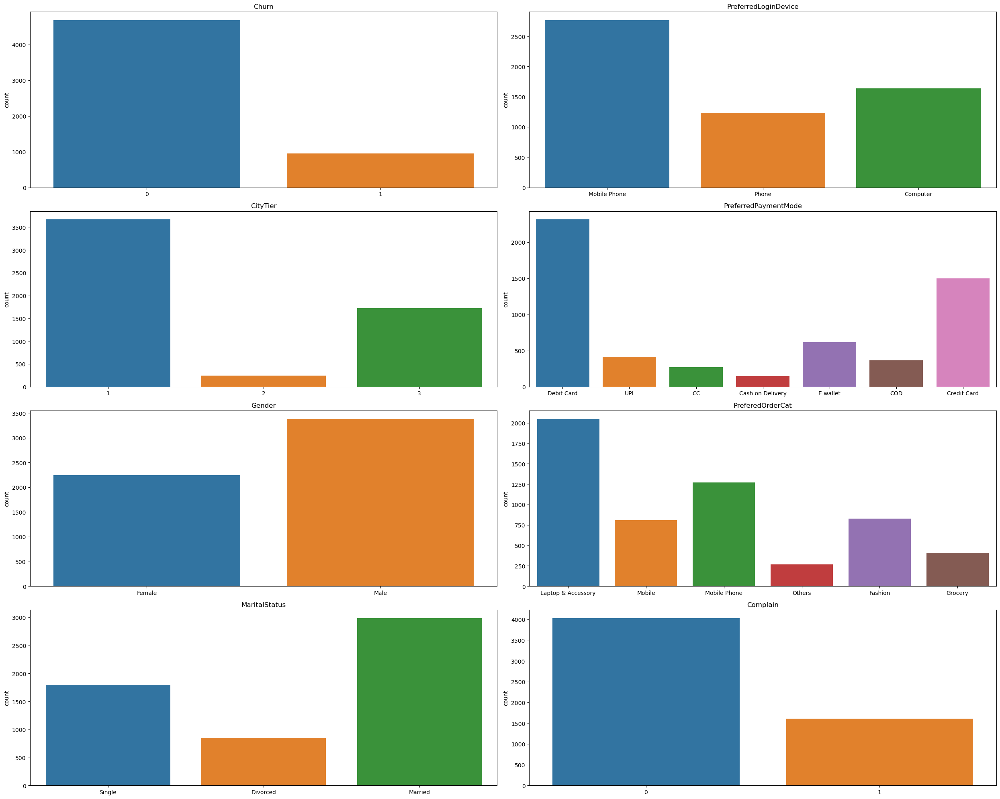

In [39]:
# Let's visualize the frequencies of our Categorical Variables. 
plt.figure(figsize = (25, 20))
for i, feature in enumerate(cat_features, 1):
    plt.subplot(4, 2, i)
    sns.countplot(data = df, x = feature)
    plt.title(feature)
    plt.xlabel("")
plt.tight_layout()
plt.show()



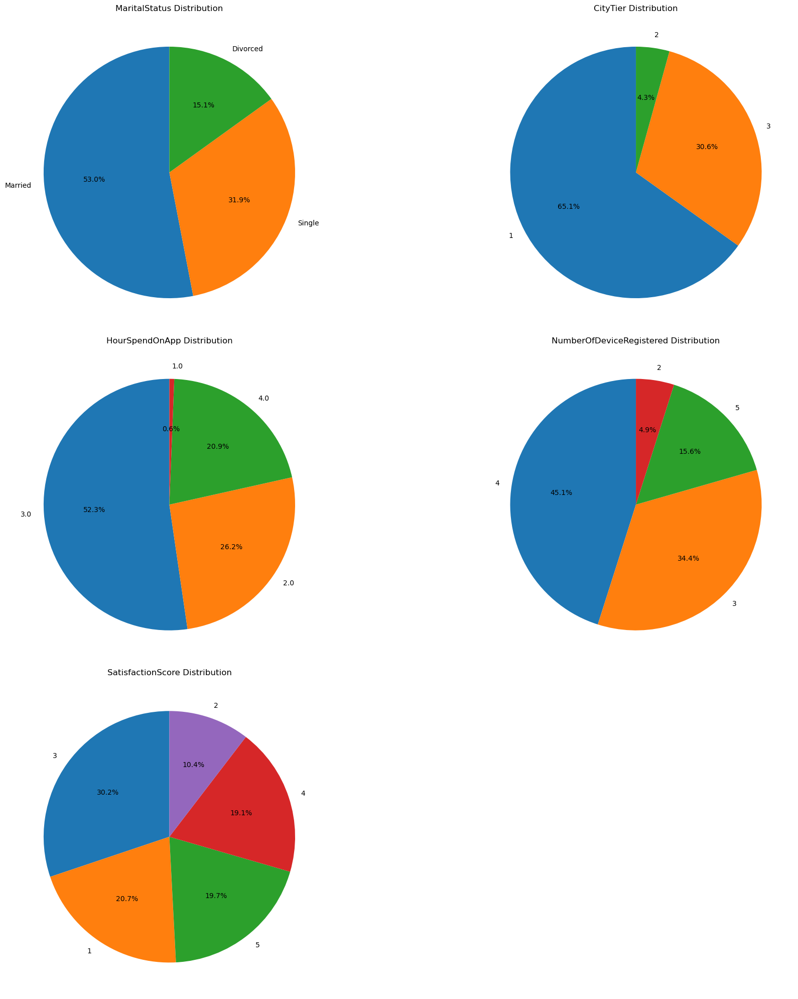

In [41]:
least_three = ['MaritalStatus','CityTier', 'HourSpendOnApp', 'NumberOfDeviceRegistered', 'SatisfactionScore']

# subplots
fig, axs = plt.subplots(nrows = 3, ncols = 2, figsize = (20, 20))

# Visualize categories with more than 3 unique values
for i, feature in enumerate(least_three):   # When iterating over more than three items, we can use the enumerate function to keep track of both the value and index of each item.
    if i < len(axs.flat):
        # Calculating the frequency of unique values 
        val_freq = df[feature].value_counts()

        # Graph Creation
        axs.flat[i].pie(val_freq, labels = val_freq.index, autopct = '%1.1f%%', startangle = 90)

        # Let's create our titles for each chart
        axs.flat[i].set_title(f'{feature} Distribution')
        
axs[2,1].remove()   # We made 6 cells, let's remove one of them

# To fit charts
fig.tight_layout()

plt.show()

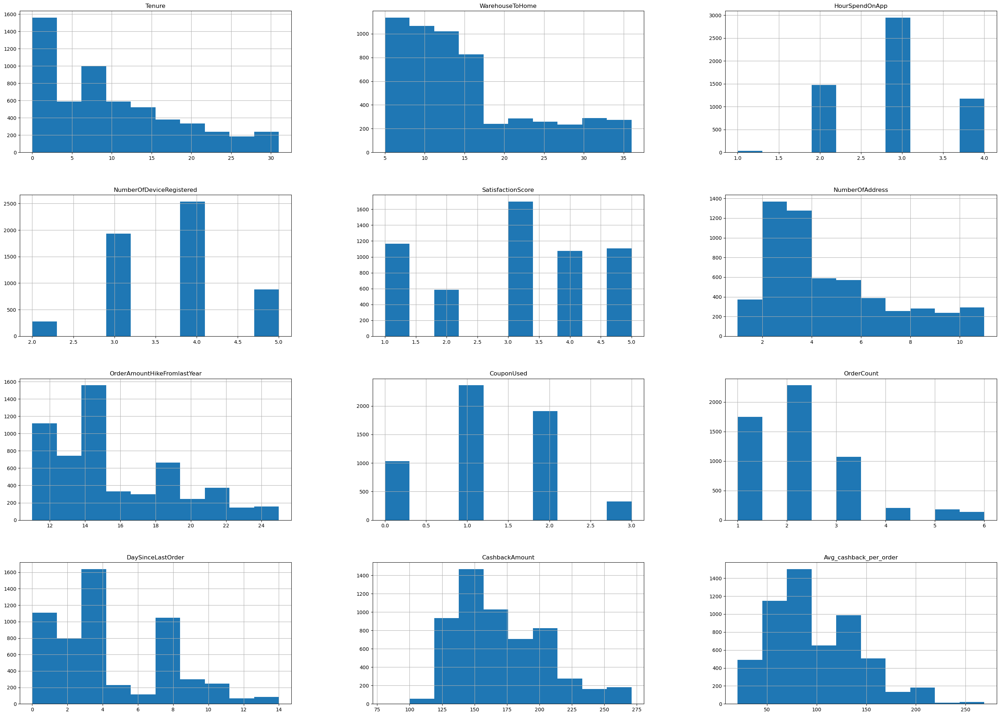

In [42]:
# We use a histogram plot to examine the distribution of numerical variables and check for any skewness in the data.
# We can assess the central tendency, the number of peaks, and determine if variables with a single peak are concentrated around a central value.

df[num_features].hist(figsize = (35,25))  
plt.show()

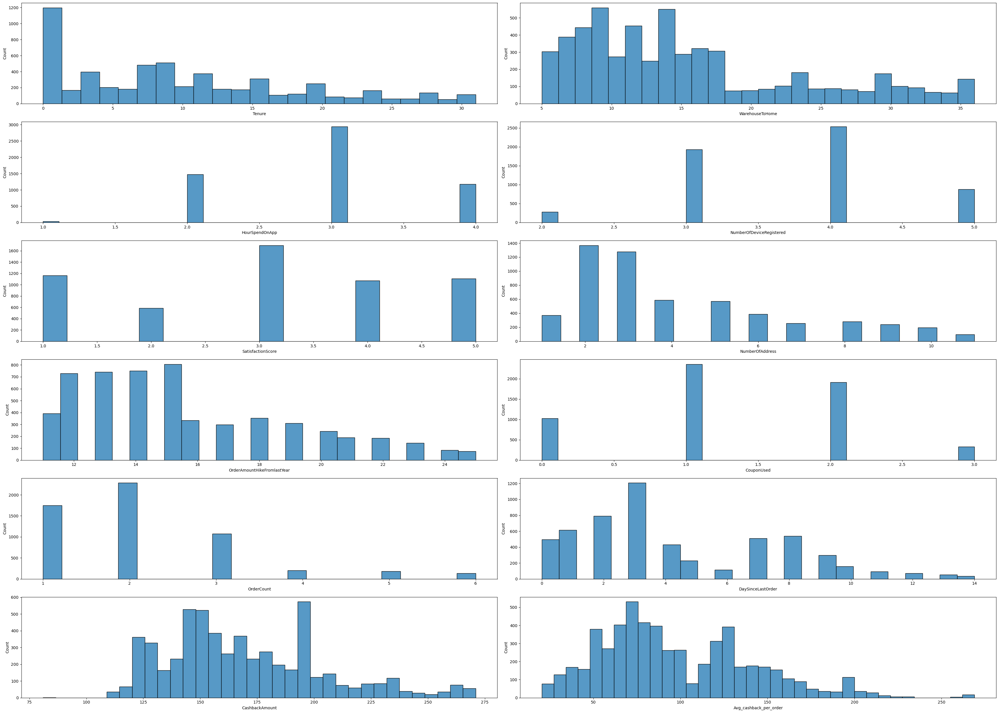

In [43]:
# Alternative visualization for numeric variables
fig, ax = plt.subplots(6, 2, figsize = (35, 25))
for feature, subplot in zip(num_features, ax.flatten()):
    sns.histplot(df[feature], ax = subplot)

plt.tight_layout()
plt.show()


## Bar Graph between Churn and Other Features


### Categorical Features and Churn

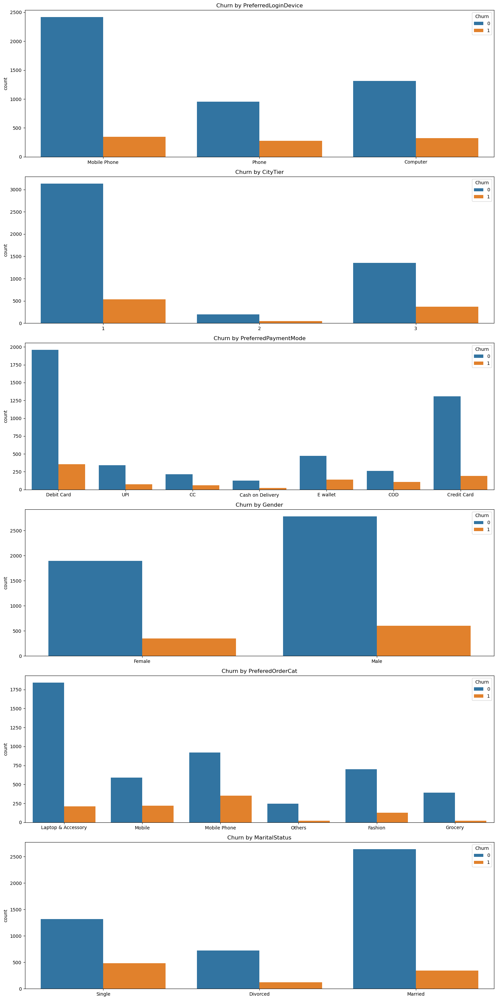

In [45]:

# Plot countplots for each categorical feature against 'Churn'

fig, ax = plt.subplots(6, 1, figsize=(15, 30))
churnless_cats = cat_features.copy()
churnless_cats.remove('Churn')
for feature, ax1 in zip(churnless_cats, ax.flatten()):
    sns.countplot(data=df, x=feature, hue='Churn', ax=ax1)
    ax1.set_title(f'Churn by {feature}')
    ax1.set_xlabel('')
    ax1.legend(title='Churn', loc='upper right')

plt.tight_layout()
plt.show()



### Numerical Features ve Churn

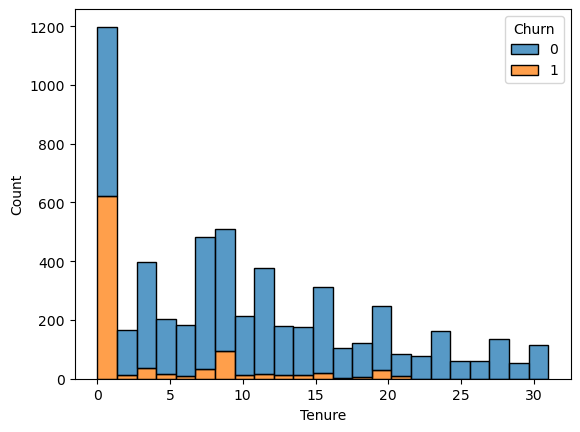

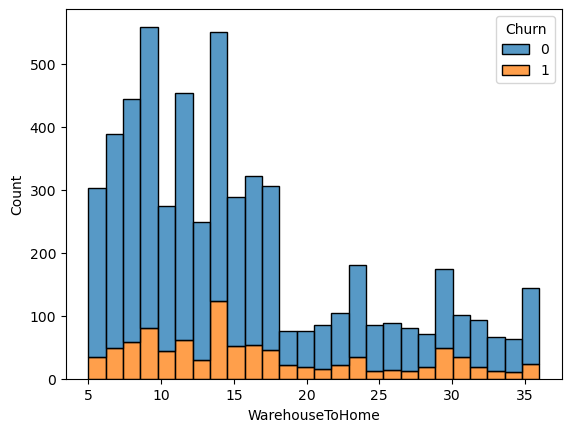

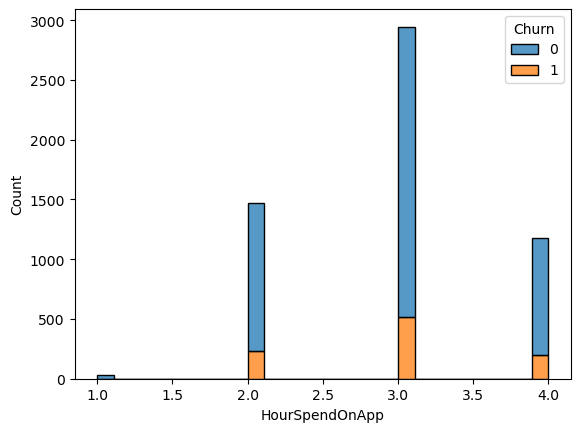

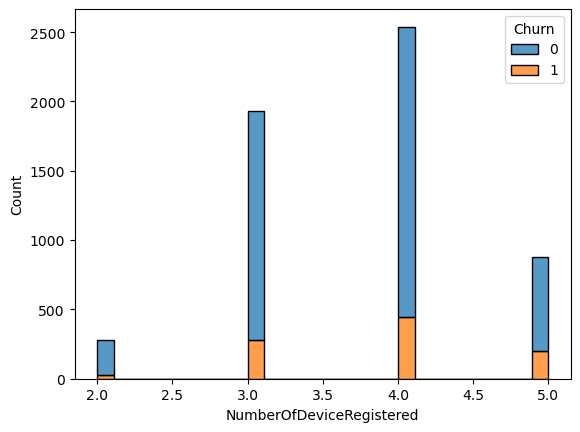

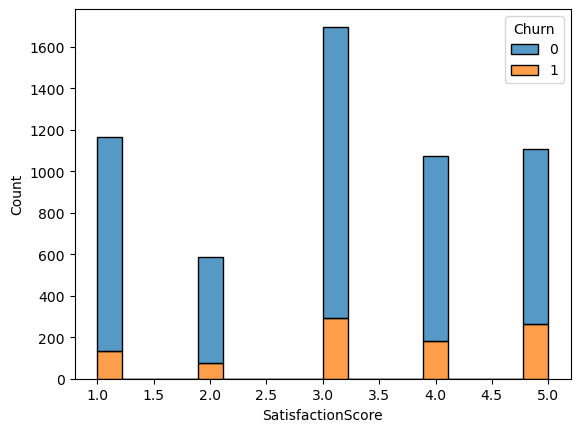

...

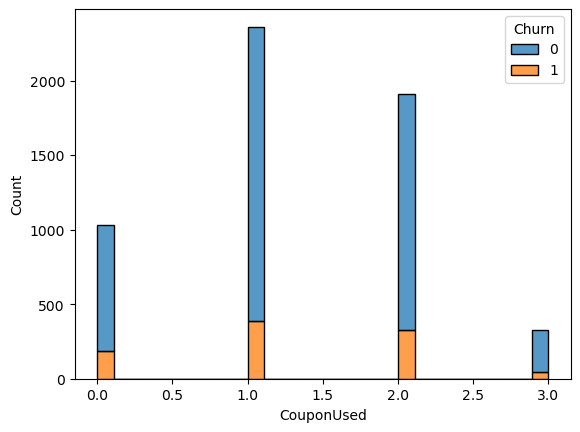

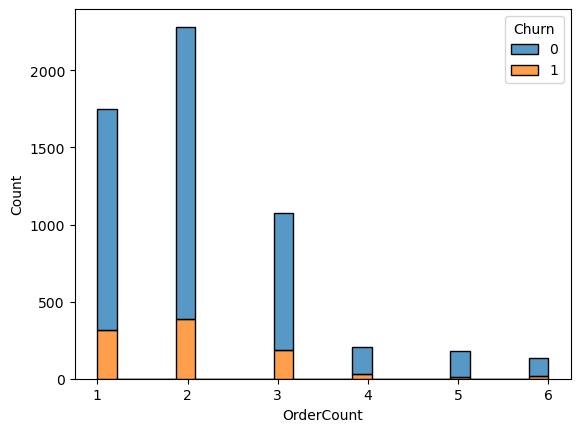

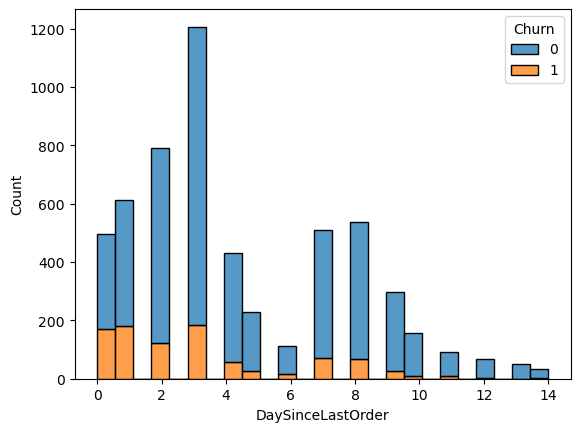

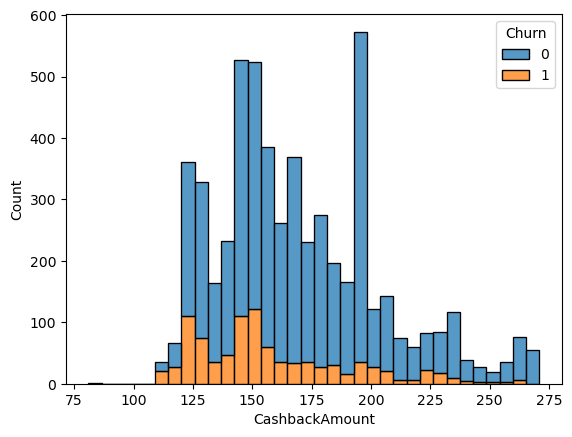

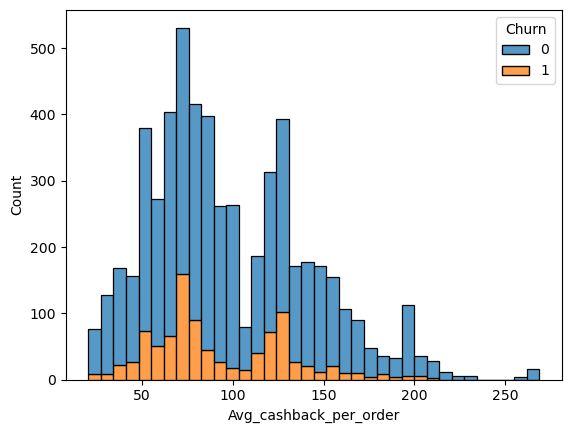

In [46]:
#Churn e karşı Histplotlar
# 1 Tenure ve Churn
sns.histplot(df, x = 'Tenure', hue ='Churn', multiple = 'stack', legend = True)
plt.show()

# 2 WarehouseToHome ve Churn
sns.histplot(df, x = 'WarehouseToHome', hue = 'Churn', multiple = 'stack', legend = True)
plt.show()

# 3 HourSpendOnApp ve Churn
sns.histplot(df, x = 'HourSpendOnApp', hue = 'Churn', multiple = 'stack', legend = True)
plt.show()

# 4 NumberOfDeviceRegistered ve Churn
sns.histplot(df, x = 'NumberOfDeviceRegistered', hue = 'Churn', multiple = 'stack', legend = True)
plt.show()

# 5 SatisfactionScore ve Churn
sns.histplot(df, x = 'SatisfactionScore', hue = 'Churn', multiple = 'stack', legend = True)
plt.show()

# 6 NumberOfAddress ve Churn
sns.histplot(df, x = 'NumberOfAddress', hue = 'Churn', multiple = 'stack', legend = True)
plt.show()

# 7 OrderAmountHikeFromlastYear ve Churn
sns.histplot(df, x = 'OrderAmountHikeFromlastYear', hue = 'Churn', multiple = 'stack', legend = True)
plt.show()

# 8 CouponUsed ve Churn
sns.histplot(df, x = 'CouponUsed', hue = 'Churn', multiple = 'stack', legend = True)
plt.show()

# 9 OrderCount ve Churn
sns.histplot(df, x = 'OrderCount', hue = 'Churn', multiple = 'stack', legend = True)
plt.show()

# 10 DaySinceLastOrder ve Churn
sns.histplot(df, x = 'DaySinceLastOrder', hue = 'Churn', multiple = 'stack', legend = True)
plt.show()

# 11 CashbackAmount ve Churn
sns.histplot(df, x = 'CashbackAmount', hue = 'Churn', multiple = 'stack', legend = True)
plt.show()

# 12 Avg_cashback_per_order ve Churn
sns.histplot(df, x = 'Avg_cashback_per_order', hue = 'Churn', multiple = 'stack', legend = True)
plt.show()

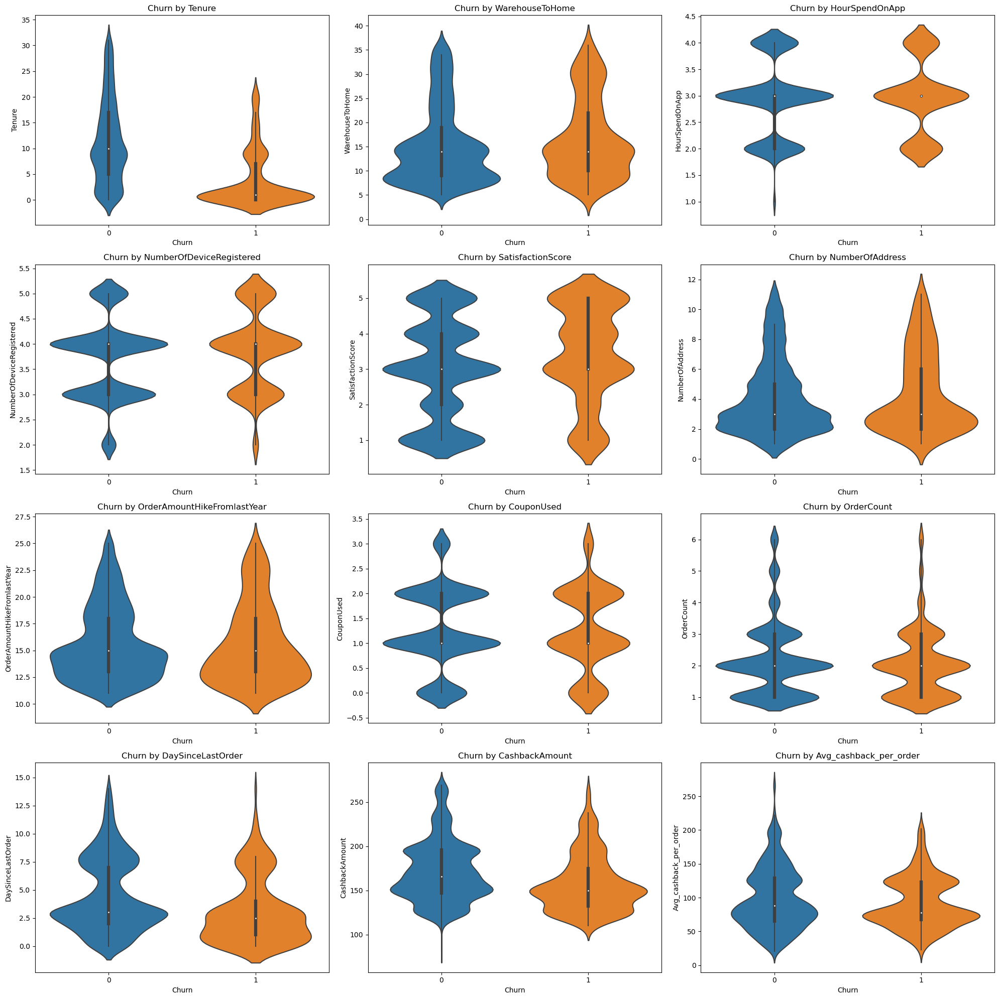

In [47]:
# Create violin plots for detailed visualization

fig, ax1 = plt.subplots(nrows=4, ncols=3, figsize=(20, 20))
ax1 = ax1.flatten()

for i, feature in enumerate(num_features):
    sns.violinplot(data=df, x='Churn', y=feature, ax=ax1[i])
    ax1[i].set_title(f'Churn by {feature}')
    ax1[i].set_xlabel('Churn')
    ax1[i].set_ylabel(feature)

fig.tight_layout()
plt.show()


In [244]:
# To examine the relationship between 'Churn' and other variables in more detail,
# we created three subsets of churn: churned customers, percentage of churned customers, and total customers.


In [48]:
# A closer look at the 'Churn' feature

import pandas as pd

tables = {}

for feature in df.columns:
    churned_customers = df[feature].groupby(by=df['Churn']).value_counts()[1]
    total_customers = df[feature].value_counts()
    churned_customers.sort_index(inplace=True)
    total_customers.sort_index(inplace=True)
    churn_percentage = churned_customers * 100 / total_customers
    table_data = {
        'Churned Customers': churned_customers,
        'Total Customers': total_customers,
        'Churn Percentage': churn_percentage
    }
    
    table = pd.DataFrame(table_data)
    table = table.fillna(0)
    tables[feature] = table





In [50]:
import pandas as pd

final_df = pd.DataFrame()  # Create an empty DataFrame

for key in tables:
    current_df = pd.concat([tables[key]], keys=[key], ignore_index=False, axis=0)
    final_df = pd.concat([final_df, current_df], axis=0)

pd.set_option('display.max_rows', None)



Churned Customers  Total Customers  Churn Percentage
Churn  0.0                0.0             4682          0.000000
       1.0              948.0              948        100.000000
Tenure 0.0              272.0              508         53.543307
       1.0              349.0              690         50.579710
       2.0               14.0              167          8.383234

In [51]:
final_df.head()

Churned Customers  Total Customers  Churn Percentage
Churn  0.0                0.0             4682          0.000000
       1.0              948.0              948        100.000000
Tenure 0.0              272.0              508         53.543307
       1.0              349.0              690         50.579710
       2.0               14.0              167          8.383234

### Functions for Graphs


In [66]:
def bar_line_maker(feature):
    data = final_df.loc[feature]

    fig, ax1 = plt.subplots(figsize=plt.figaspect(0.5))

    # Bar plot to show Total Customers and Churned Customers on the same bar
    ax1.bar(data.index, data['Total Customers'], label='Total Customers', alpha=0.5)
    ax1.bar(data.index, data['Churned Customers'], label='Churned Customers', alpha=0.5)
    ax1.set_xlabel(feature)
    ax1.set_ylabel('Customer Count')
    ax1.legend(loc='upper left')

    # Add a line plot to show Churn Percentage
    ax2 = ax1.twinx()
    ax2.plot(data.index, data['Churn Percentage'], color='red', marker='*', markerfacecolor='blue', markeredgecolor='blue', label='Churn Percentage (%)')
    ax2.set_ylabel('Churn Percentage (%)')
    ax2.legend(loc='upper right')

    plt.show()



In [67]:
churn_true = df[df['Churn'] == 1]['Churn'].count()
churn_false = df[df['Churn'] == 0]['Churn'].count()
churn_percentage = round(churn_true * 100 / churn_false, 2)

def graph_maker(feature_name):
    fig, ax1 = plt.subplots(figsize=(12, 6), dpi=150)
    color = 'tab:blue'
    color1 = 'tab:orange'
    color2 = 'tab:brown'
    
    ax1.set_xlabel(df[feature_name].name)
    ax1.set_ylabel('Customer Count', color=color)
    
    ax1.plot(final_df.loc[feature_name].index, final_df.loc[feature_name]['Total Customers'].values, color=color, marker='x', label='Total Customers')
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.plot(final_df.loc[feature_name].index, final_df.loc[feature_name]['Churned Customers'].values, color=color1, marker='o', label='Churned Customers')
    
    ax2 = ax1.twinx()
    ax2.set_ylim(-5, )
    
    color = 'tab:orange'
    ax2.plot(final_df.loc[feature_name].index, final_df.loc[feature_name]['Churn Percentage'].values, color=color2, marker='*', label='Churn Percentage')
    
    ax2.axhline(y=churn_percentage, color='purple', linestyle='--')
    
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='center right', bbox_to_anchor=(1.3, 0.75))
    
    ax2.set_ylabel('Churn Percentage', color=color2)
    ax2.tick_params(axis='y', labelcolor=color2)
    ax2.autoscale(enable=True, axis='y')
    ax1.autoscale(enable=True, axis='y')
    
    sns.despine(ax=ax1, right=True, left=True)
    sns.despine(ax=ax2, left=True, right=False)

    plt.show()



In [68]:
def scatter_maker(feature_name):
    fig, ax1 = plt.subplots(figsize=(12, 6), dpi=150)
    color = 'tab:blue'
    color1 = 'tab:orange'
    color2 = 'tab:brown'

    ax1.set_xlabel(df[feature_name].name)
    ax1.set_ylabel('Customer Count', color=color)

    ax1.scatter(final_df.loc[feature_name].index, final_df.loc[feature_name]['Total Customers'].values, color=color, marker='o', label='Total Customers')
    ax1.scatter(final_df.loc[feature_name].index, final_df.loc[feature_name]['Churned Customers'].values, color=color1, marker='o', label='Churned Customers')

    ax1.tick_params(axis='y', labelcolor=color)
    ax2 = ax1.twinx()
    ax2.set_ylim(-5,)

    ax2.scatter(final_df.loc[feature_name].index, final_df.loc[feature_name]['Churn Percentage'].values, color=color2, marker='o', label='Churn Percentage')
    ax2.axhline(y=churn_percentage, color='purple', linestyle='--')

    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()

    ax1.legend(lines1 + lines2, labels1 + labels2, loc='center right', bbox_to_anchor=(1.3, 0.75))

    ax2.set_ylabel('Churn Percentage', color=color2)
    ax2.tick_params(axis='y', labelcolor=color2)
    ax2.autoscale(enable=True, axis='y')
    ax1.autoscale(enable=True, axis='y')

    sns.despine(ax=ax1, right=True, left=True)
    sns.despine(ax=ax2, left=True, right=False)

    plt.show()


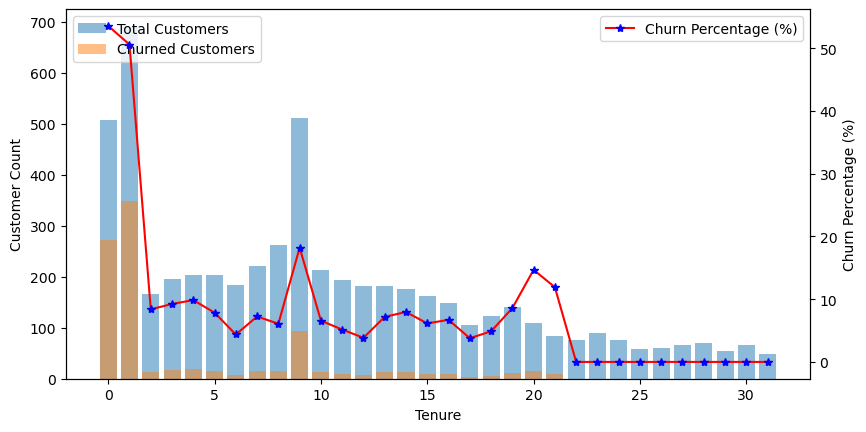

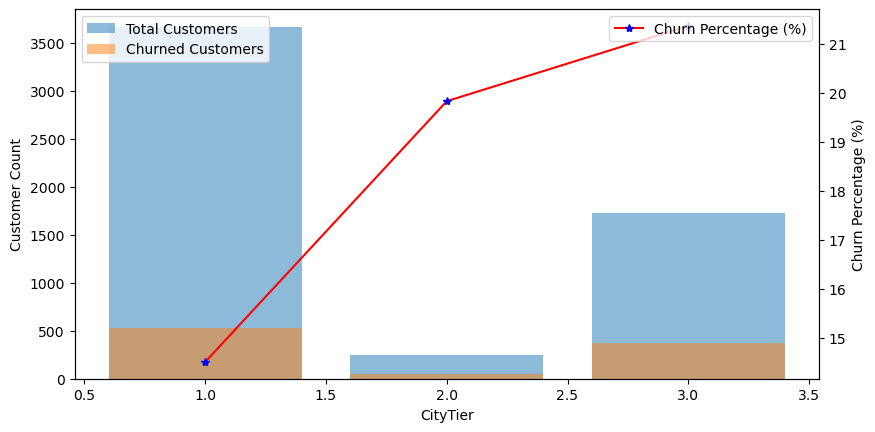

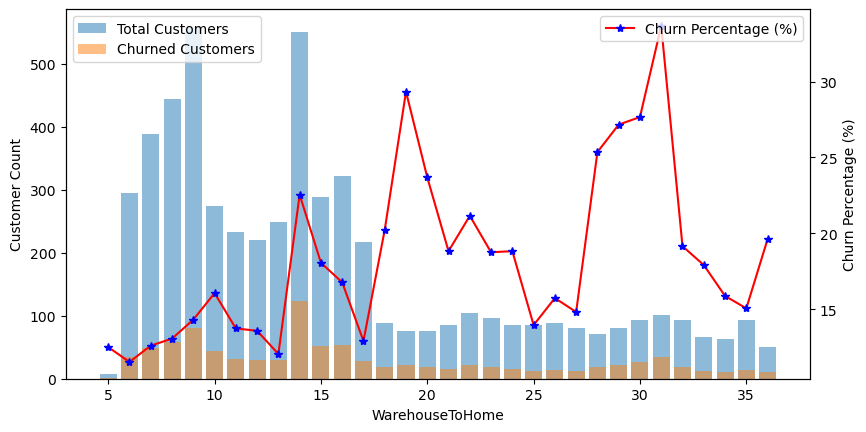

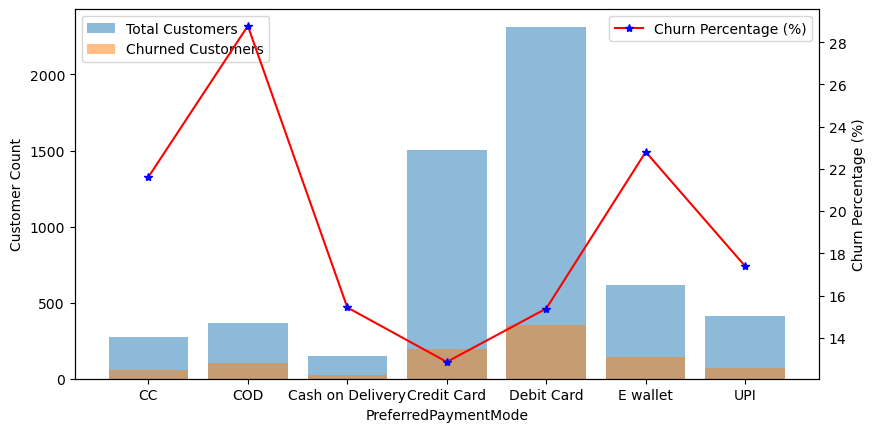

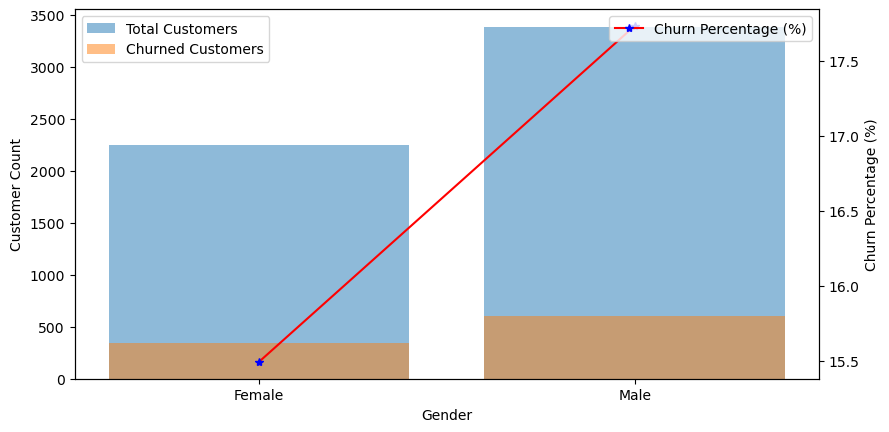

...

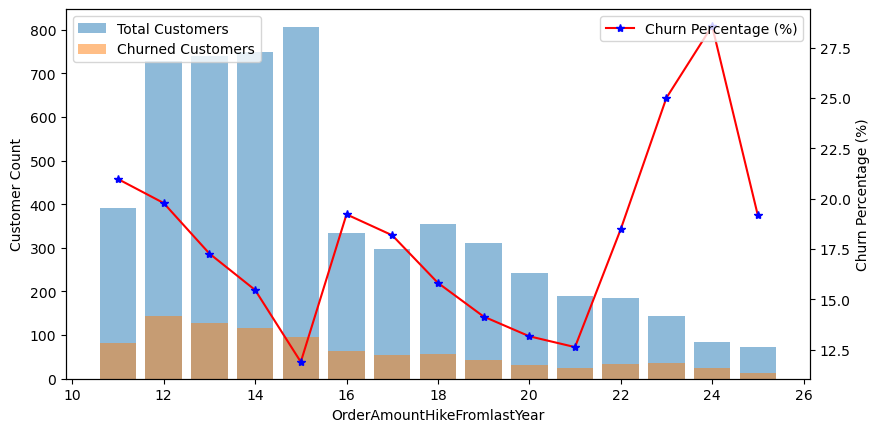

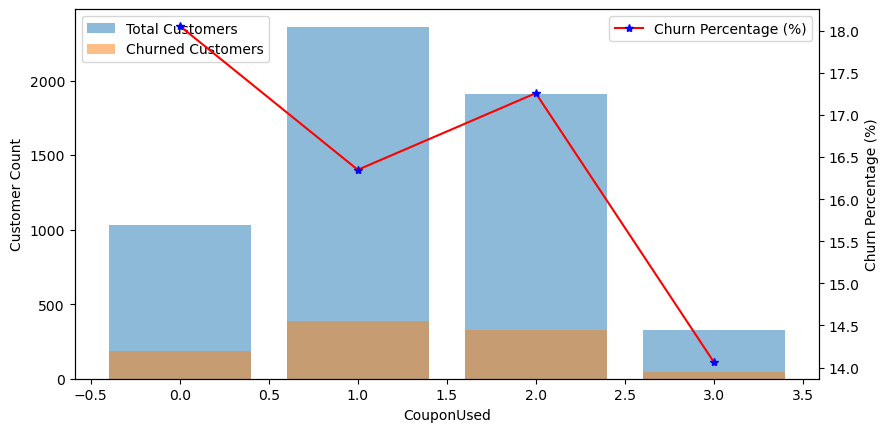

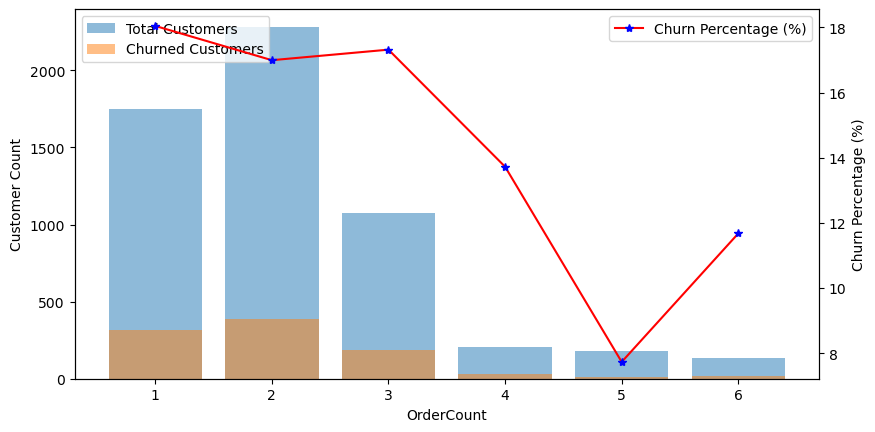

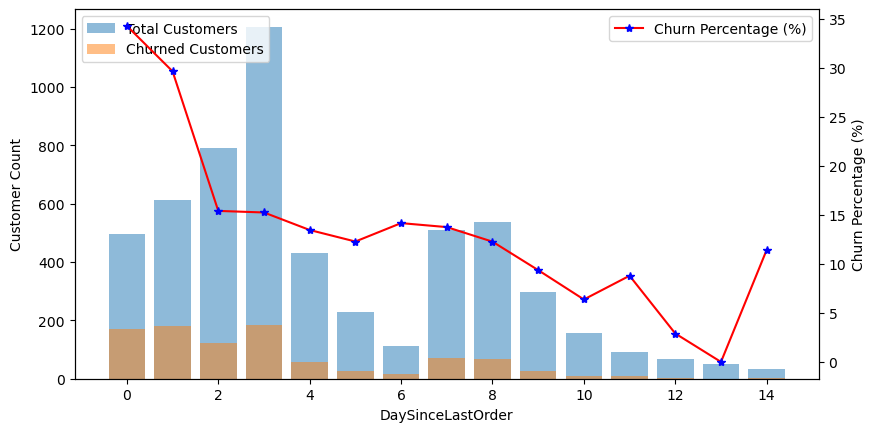

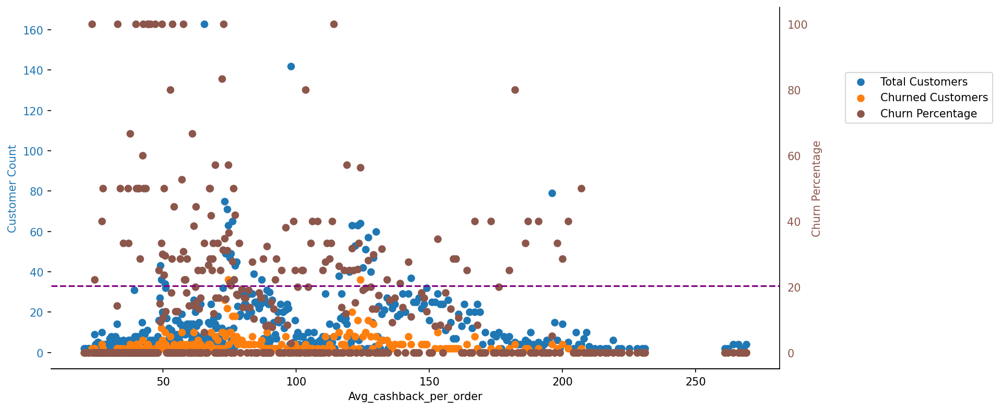

In [69]:
bar_line_maker('Tenure')

bar_line_maker('CityTier')

bar_line_maker('WarehouseToHome')

bar_line_maker('PreferredPaymentMode')

bar_line_maker('Gender')

bar_line_maker('HourSpendOnApp')

bar_line_maker('NumberOfDeviceRegistered')

bar_line_maker('PreferedOrderCat')

bar_line_maker('SatisfactionScore')

bar_line_maker('MaritalStatus')

bar_line_maker('NumberOfAddress')

bar_line_maker('Complain')

bar_line_maker('OrderAmountHikeFromlastYear')

bar_line_maker('CouponUsed')

bar_line_maker('OrderCount')

bar_line_maker('DaySinceLastOrder')

scatter_maker('Avg_cashback_per_order')

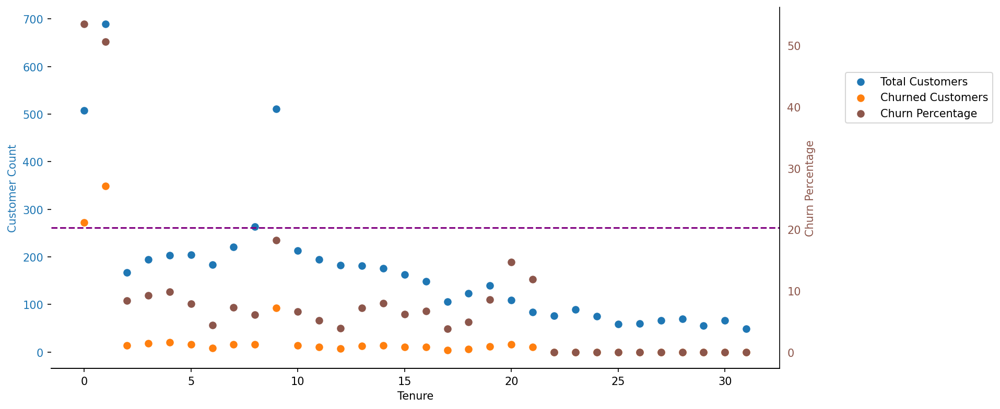

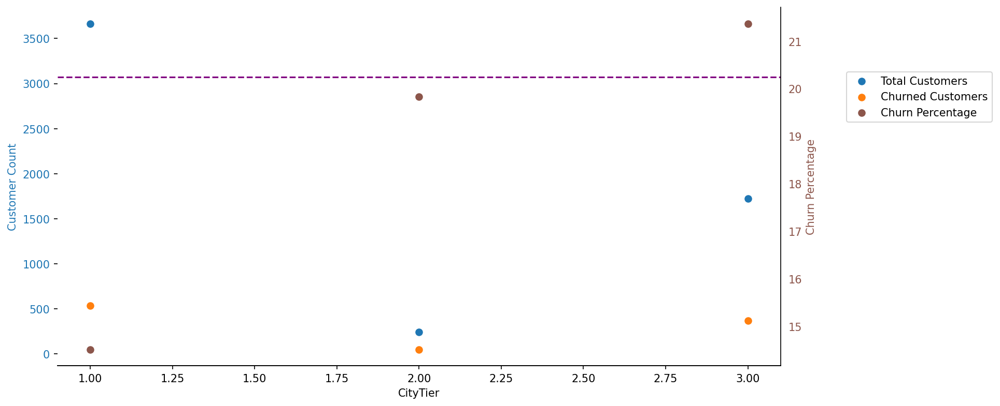

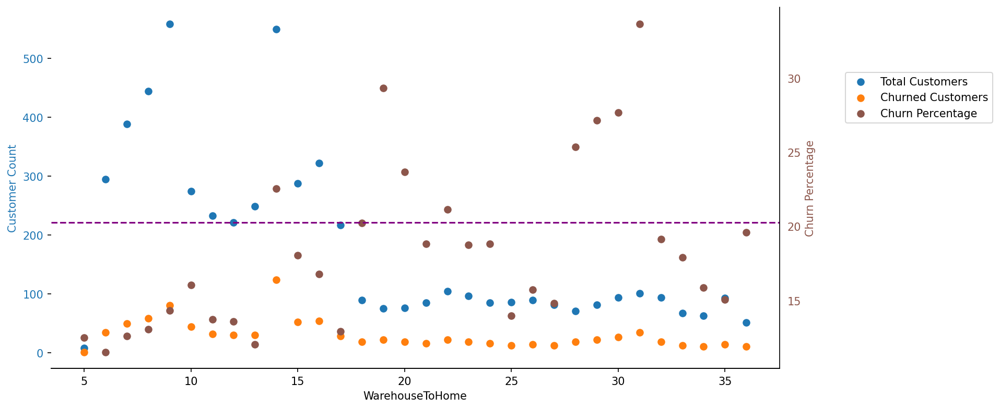

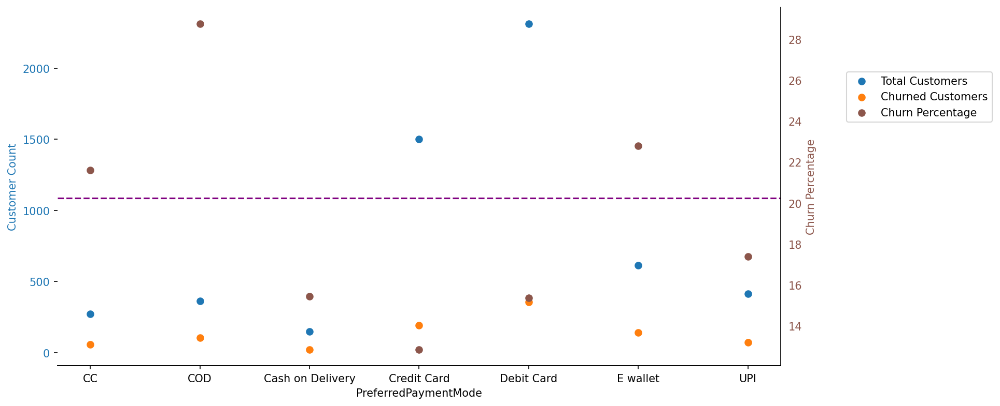

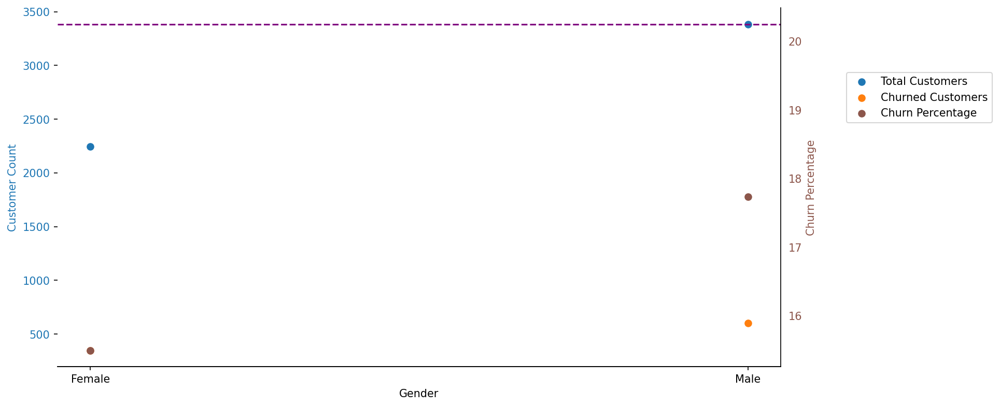

...

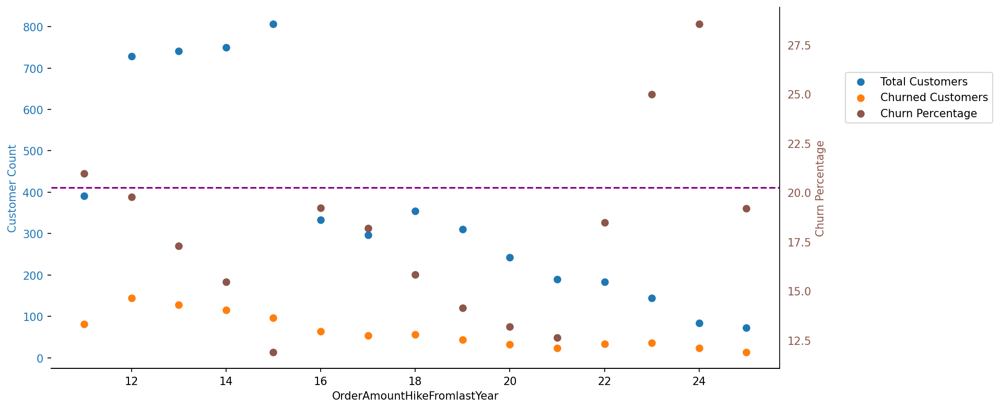

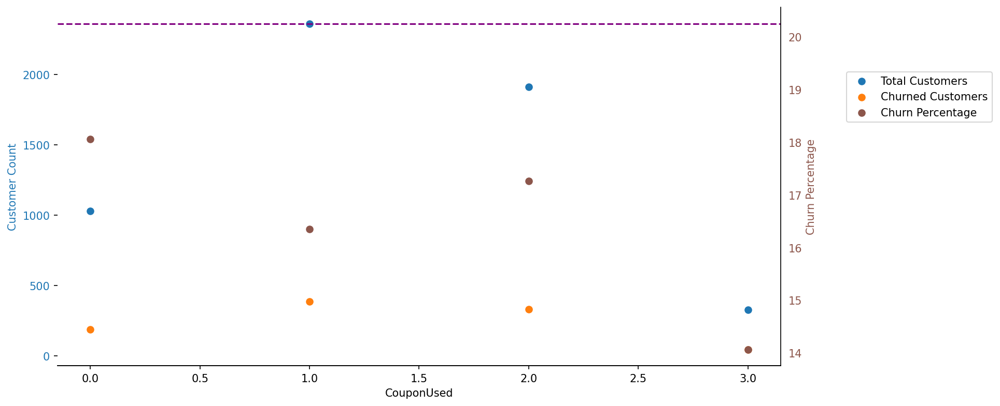

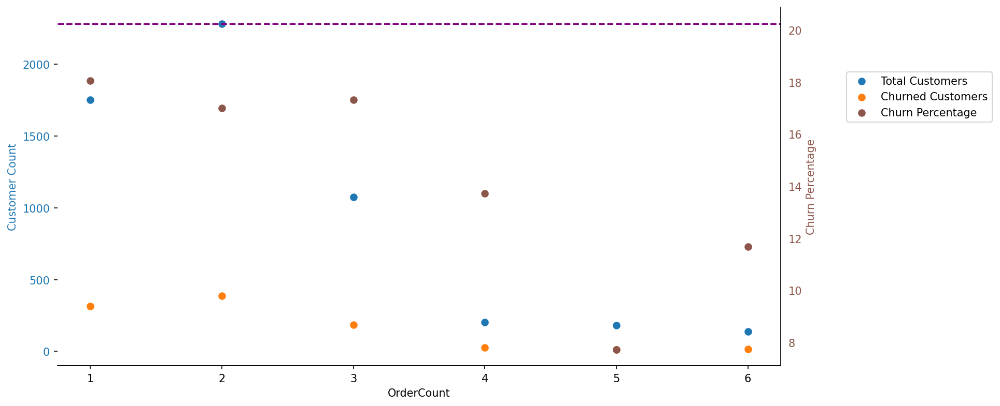

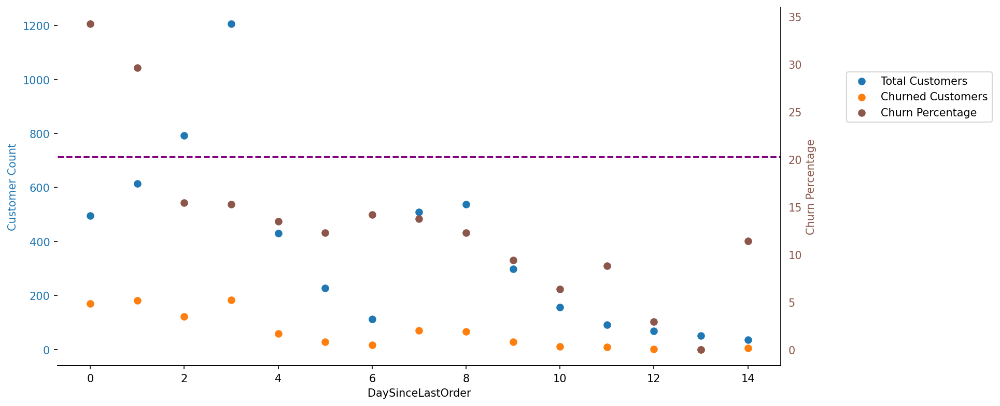

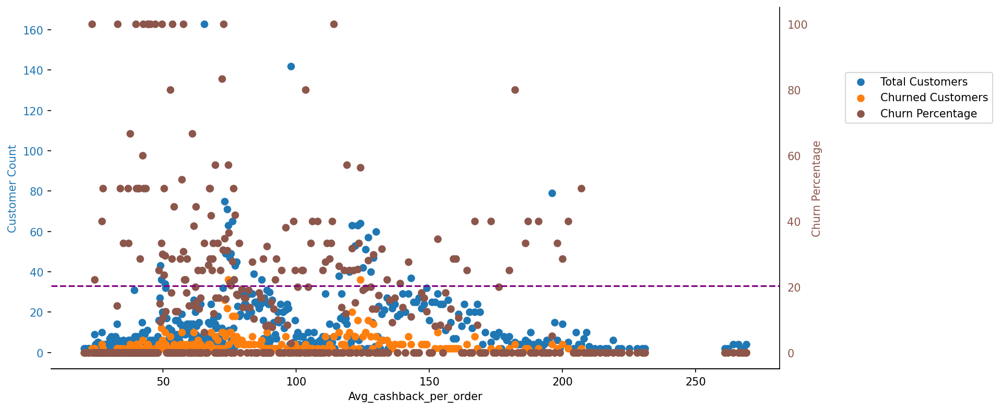

In [71]:
# Gereksiz

scatter_maker('Tenure')

scatter_maker('CityTier')

scatter_maker('WarehouseToHome')

scatter_maker('PreferredPaymentMode')

scatter_maker('Gender')

scatter_maker('HourSpendOnApp')

scatter_maker('NumberOfDeviceRegistered')

scatter_maker('PreferedOrderCat')

scatter_maker('SatisfactionScore')

scatter_maker('MaritalStatus')

scatter_maker('NumberOfAddress')

scatter_maker('Complain')

scatter_maker('OrderAmountHikeFromlastYear')

scatter_maker('CouponUsed')

scatter_maker('OrderCount')

scatter_maker('DaySinceLastOrder')

scatter_maker('Avg_cashback_per_order')

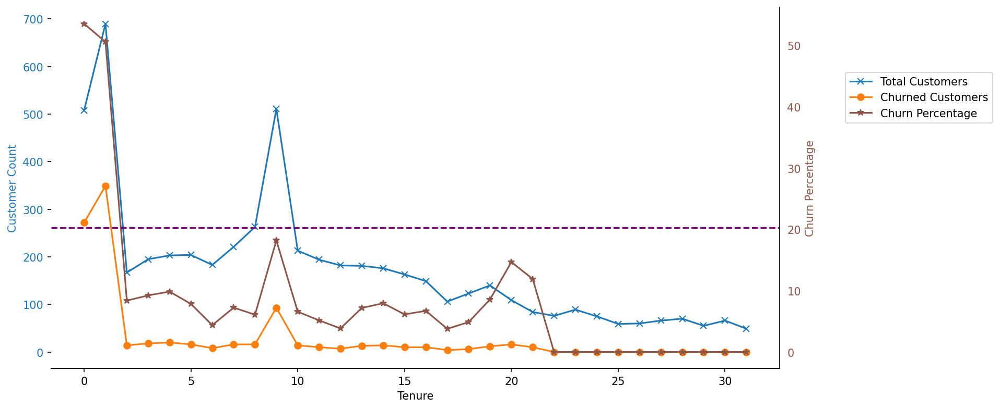

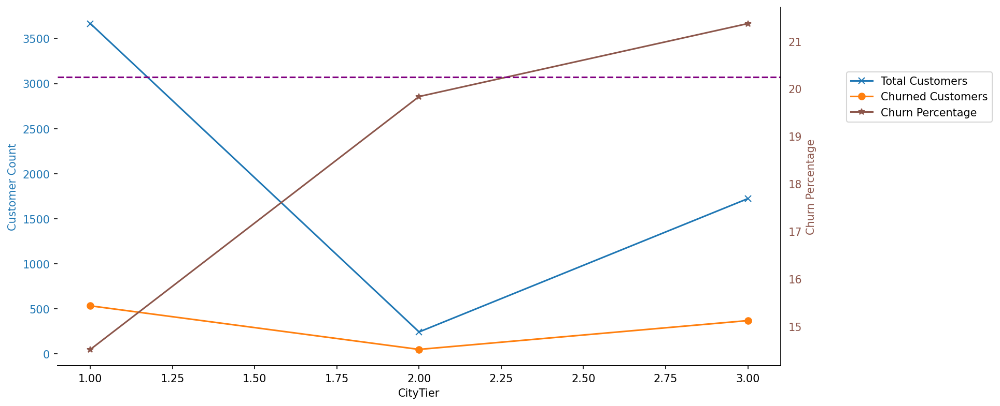

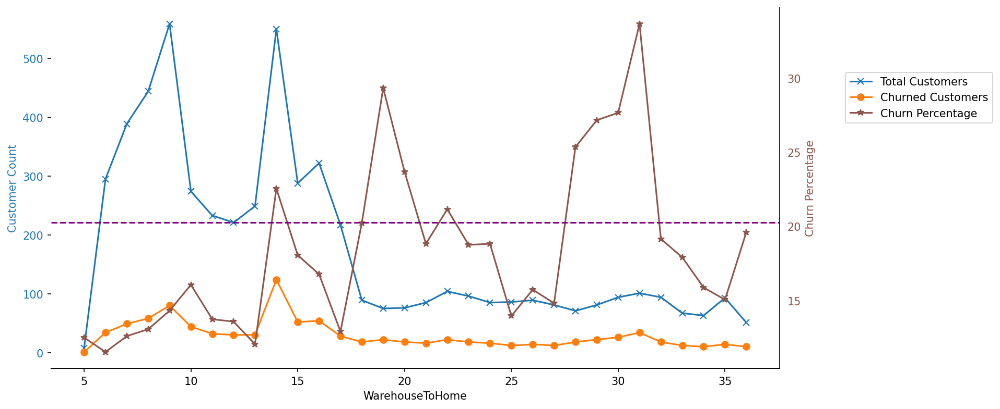

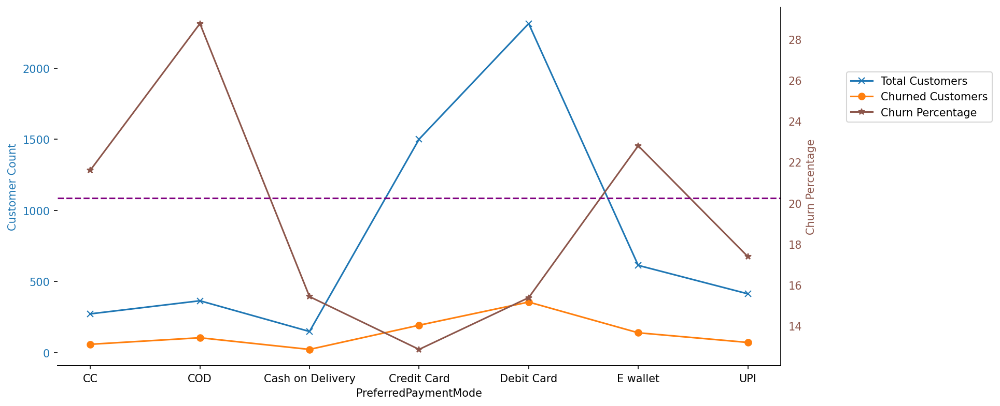

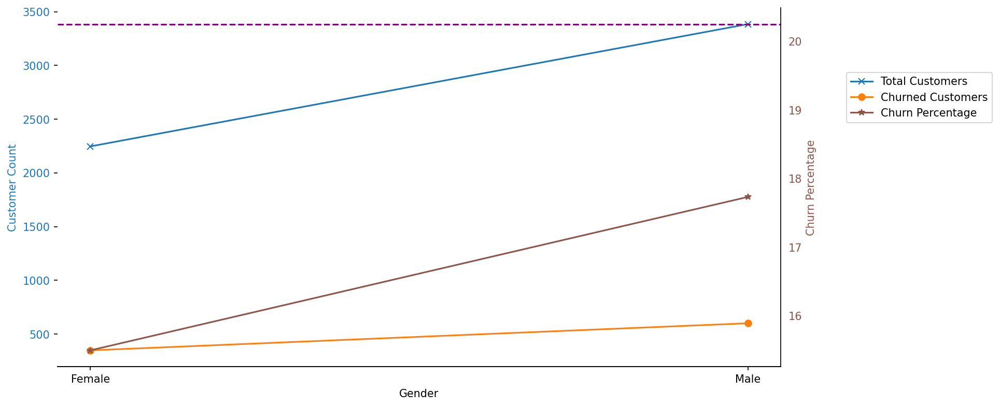

...

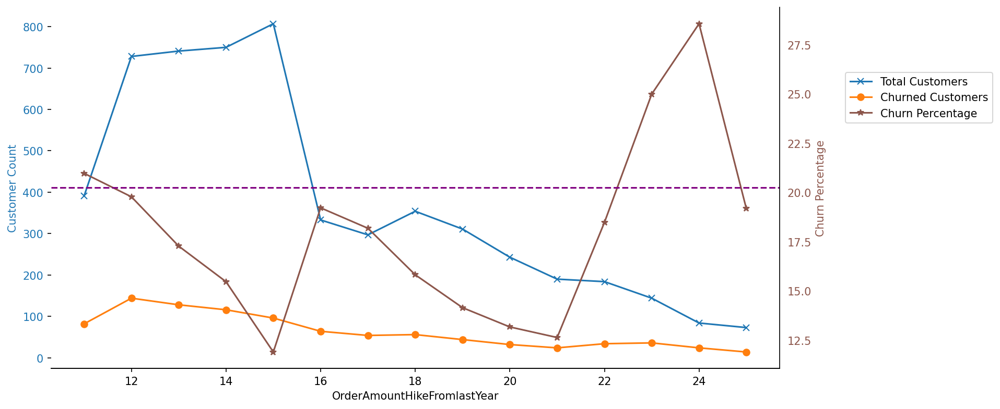

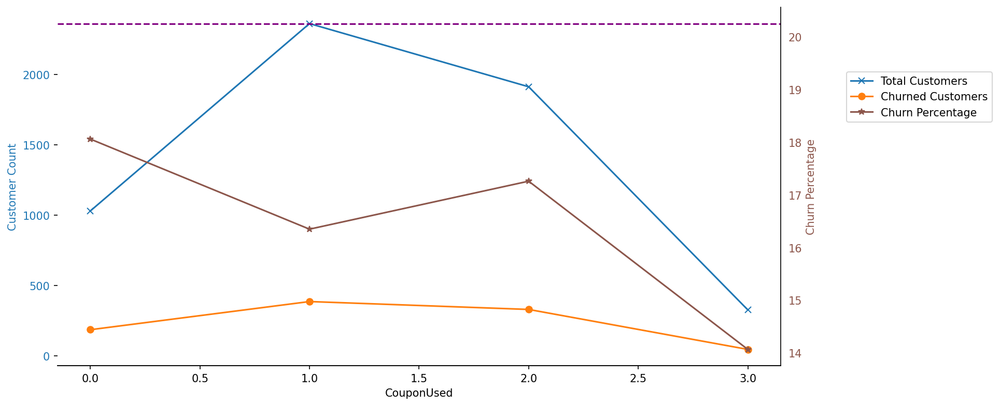

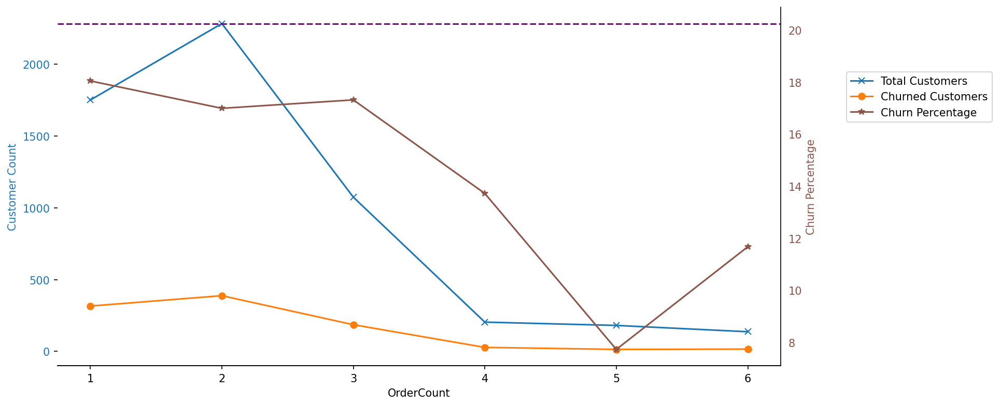

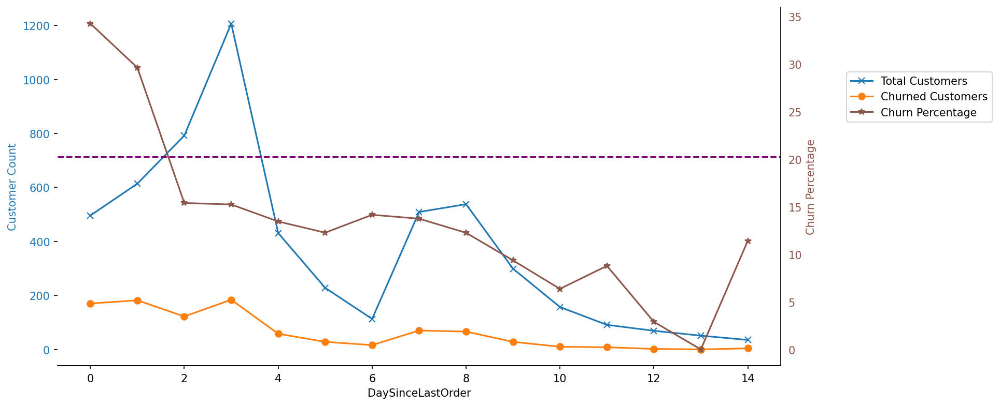

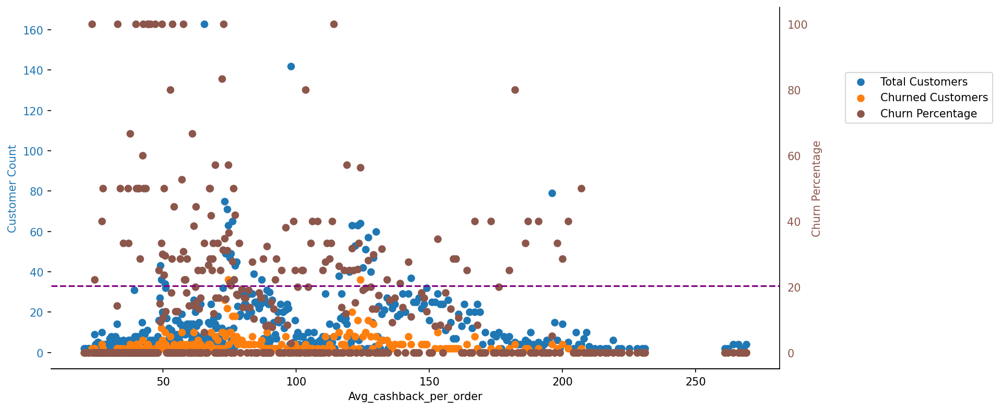

In [72]:
# Anlaşılabilir fakat biraz zorlama
graph_maker('Tenure')

graph_maker('CityTier')

graph_maker('WarehouseToHome')

graph_maker('PreferredPaymentMode')

graph_maker('Gender')

graph_maker('HourSpendOnApp')

graph_maker('NumberOfDeviceRegistered')

graph_maker('PreferedOrderCat')

graph_maker('SatisfactionScore')

graph_maker('MaritalStatus')

graph_maker('NumberOfAddress')

graph_maker('Complain')

graph_maker('OrderAmountHikeFromlastYear')

graph_maker('CouponUsed')

graph_maker('OrderCount')

graph_maker('DaySinceLastOrder')

scatter_maker('Avg_cashback_per_order')



C:\Users\oguzh\anaconda3\envs\test-env\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


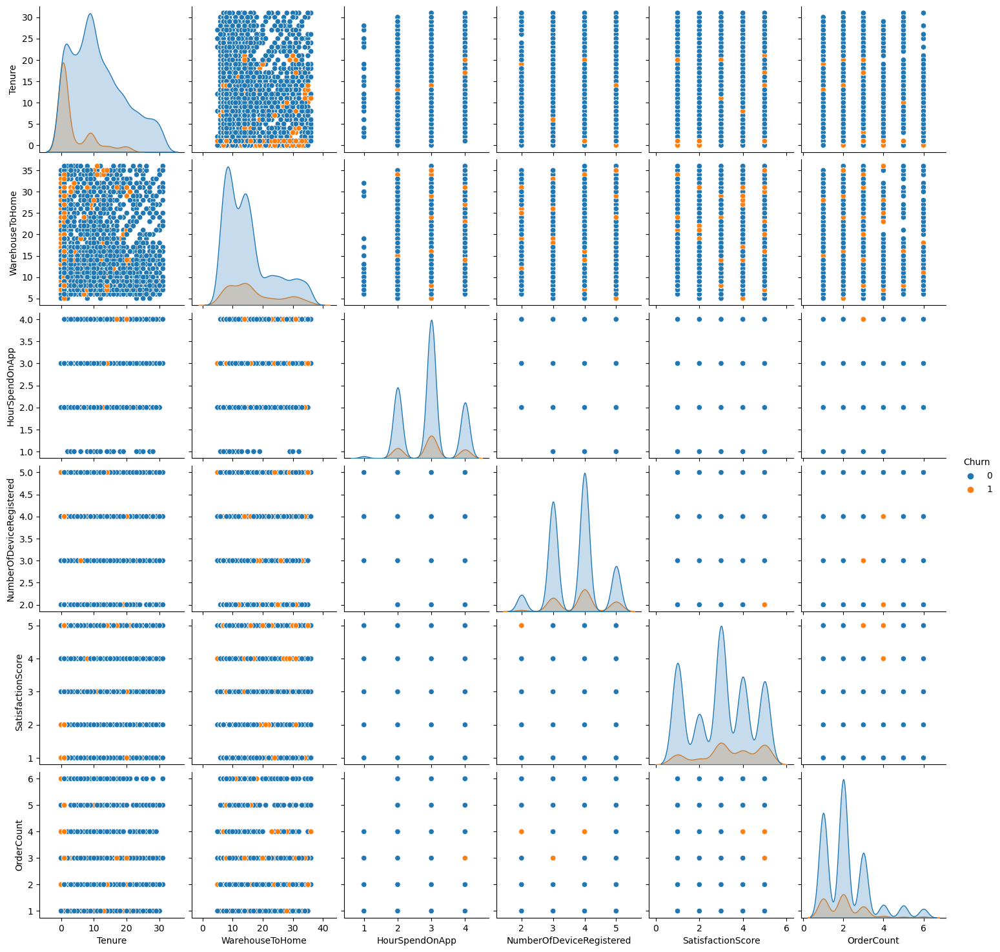

In [73]:
# Unnecessary
feature_num = ['Tenure', 'WarehouseToHome', 'HourSpendOnApp', 'NumberOfDeviceRegistered', 'SatisfactionScore', 'Churn', 'OrderCount']
sns.pairplot(df[feature_num], hue = 'Churn') 


C:\Users\oguzh\anaconda3\envs\test-env\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


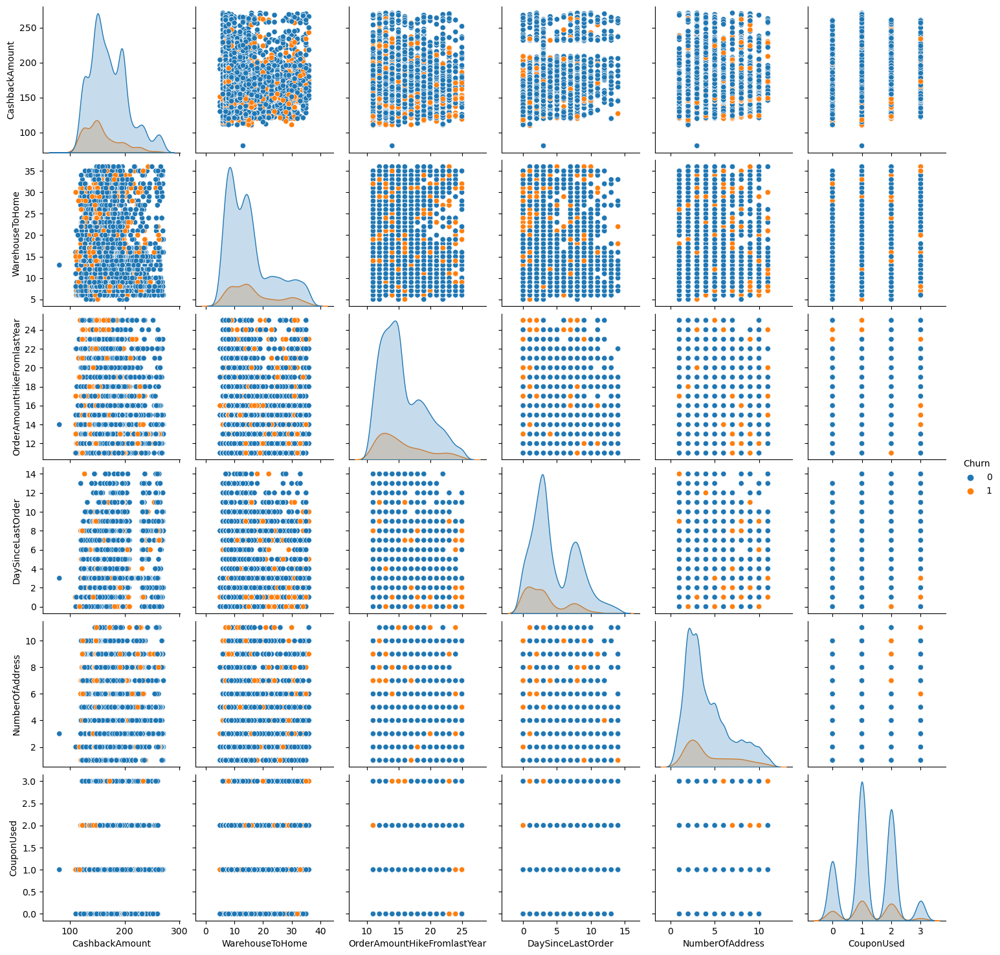

In [255]:
feature_say = ['CashbackAmount', 'WarehouseToHome', 'OrderAmountHikeFromlastYear', 'DaySinceLastOrder', 'NumberOfAddress', 'Churn', 'CouponUsed']
sns.pairplot(df[feature_say], hue = 'Churn') 

In [74]:
num_corr = num_features.copy()
num_corr.append('Churn')

<Axes: >

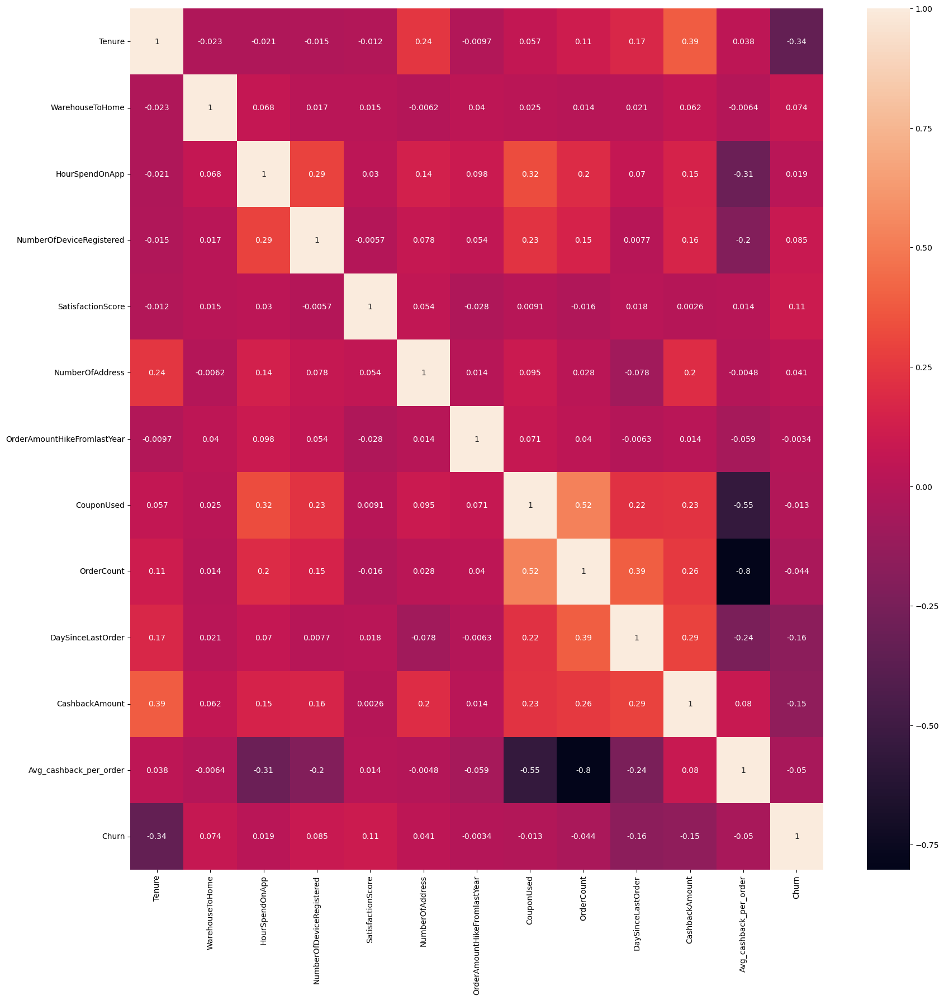

In [75]:
plt.figure(figsize = (20,20))
sns.heatmap(df[num_corr].corr(),annot = True)

## One Hot Encoding then Scaling of Numerical Variables



### One Hot Encoding

In [76]:
df_dummy = df.copy()
df_dummy.head()

,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,Avg_cashback_per_order
0,1,4.0,Mobile Phone,3,6.0,Debit Card,Female,3.0,3,Laptop & Accessory,2,Single,9,1,11.0,1.0,1.0,5.0,160,160.0
1,1,9.0,Phone,1,8.0,UPI,Male,3.0,4,Mobile,3,Single,7,1,15.0,0.0,1.0,0.0,121,121.0
2,1,9.0,Phone,1,30.0,Debit Card,Male,2.0,4,Mobile,3,Single,6,1,14.0,0.0,1.0,3.0,120,120.0
3,1,0.0,Phone,3,15.0,Debit Card,Male,2.0,4,Laptop & Accessory,5,Single,8,0,23.0,0.0,1.0,3.0,134,134.0
4,1,0.0,Phone,1,12.0,CC,Male,3.0,3,Mobile,5,Single,3,0,11.0,1.0,1.0,3.0,130,130.0


In [77]:
df_dummy = pd.get_dummies(df_dummy, drop_first = True, dtype = 'int64')   

In [78]:
df_dummy.head()

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,...,PreferredPaymentMode_UPI,Gender_Male,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single,Complain_1
0,4.0,6.0,3.0,3,2,9,11.0,1.0,1.0,5.0,...,0,0,0,1,0,0,0,0,1,1
1,9.0,8.0,3.0,4,3,7,15.0,0.0,1.0,0.0,...,1,1,0,0,1,0,0,0,1,1
2,9.0,30.0,2.0,4,3,6,14.0,0.0,1.0,3.0,...,0,1,0,0,1,0,0,0,1,1
3,0.0,15.0,2.0,4,5,8,23.0,0.0,1.0,3.0,...,0,1,0,1,0,0,0,0,1,0
4,0.0,12.0,3.0,3,5,3,11.0,1.0,1.0,3.0,...,0,1,0,0,1,0,0,0,1,0


In [79]:
df_dummy.dtypes

Tenure                                   float64
WarehouseToHome                          float64
HourSpendOnApp                           float64
NumberOfDeviceRegistered                   int64
SatisfactionScore                          int64
NumberOfAddress                            int64
OrderAmountHikeFromlastYear              float64
CouponUsed                               float64
OrderCount                               float64
DaySinceLastOrder                        float64
CashbackAmount                             int64
Avg_cashback_per_order                   float64
Churn_1                                    int64
PreferredLoginDevice_Mobile Phone          int64
PreferredLoginDevice_Phone                 int64
CityTier_2                                 int64
CityTier_3                                 int64
PreferredPaymentMode_COD                   int64
PreferredPaymentMode_Cash on Delivery      int64
PreferredPaymentMode_Credit Card           int64
PreferredPaymentMode

### Scaling of Numerical Variables

In [82]:
# We converted the categorical variables. The conversion values are kept as 1 and 0. 
# But there is a meaningless difference with other numeric variables. We need to edit this.

In [85]:
# create scaler object from standard scaler
scaler = StandardScaler()

In [86]:
features = df_dummy[num_features]    # For numerical features, we will perform scaling to ensure they are on a similar scale
features = scaler.fit_transform(features)   # We scaled the numerical features using StandardScaler, which applies the Z-score normalization.



In [265]:
features

array([[-0.73832634, -1.17941504,  0.09325492, ...,  0.19907374,
        -0.2769459 ,  1.42296582],
       [-0.13366901, -0.93187154,  0.09325492, ..., -1.32414611,
        -1.4062803 ,  0.53214448],
       [-0.13366901,  1.79110688, -1.33344405, ..., -0.4102142 ,
        -1.43523759,  0.50930291],
       ...,
       [-1.10112074, -0.5605563 ,  0.09325492, ..., -0.10557023,
         0.4759437 , -0.10741956],
       [ 1.55937153, -0.8080998 ,  1.5199539 , ...,  1.41764962,
         0.27324266, -0.18736507],
       [-0.25460048, -0.06546932,  0.09325492, ..., -0.4102142 ,
        -0.01633027, -0.30157293]])

In [87]:
scaled_df_dummy = df_dummy.copy()    # df_dummy den yeni kopya alıp scale edilmiş dataframe i oluşturalım

In [88]:
scaled_df_dummy[num_features] = features       # Put the scaled columns in place

In [89]:
scaled_df_dummy.head(15)

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,...,PreferredPaymentMode_UPI,Gender_Male,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single,Complain_1
0,-0.738326,-1.179415,0.093255,-0.911765,-0.772992,1.883200,-1.319620,-0.330738,-1.003537,0.199074,...,0,0,0,1,0,0,0,0,1,1
1,-0.133669,-0.931872,0.093255,0.363573,-0.048392,1.097923,-0.178995,-1.543014,-1.003537,-1.324146,...,1,1,0,0,1,0,0,0,1,1
2,-0.133669,1.791107,-1.333444,0.363573,-0.048392,0.705285,-0.464151,-1.543014,-1.003537,-0.410214,...,0,1,0,0,1,0,0,0,1,1
3,-1.222052,-0.065469,-1.333444,0.363573,1.400807,1.490562,2.102255,-1.543014,-1.003537,-0.410214,...,0,1,0,1,0,0,0,0,1,0
4,-1.222052,-0.436785,0.093255,-0.911765,1.400807,-0.472631,-1.319620,-0.330738,-1.003537,-0.410214,...,0,1,0,0,1,0,0,0,1,0
5,-1.222052,0.800933,0.093255,1.638912,1.400807,-0.865269,1.817099,0.881538,3.374883,0.808362,...,0,0,0,0,0,1,0,0,1,1
6,-0.133669,-0.560556,-1.333444,-0.911765,-0.772992,-0.079992,-0.464151,-1.543014,-1.003537,-1.324146,...,0,1,0,1,0,0,0,0,0,0
7,-0.133669,-1.179415,0.093255,-0.911765,-0.772992,-0.472631,0.106161,0.881538,-0.127853,-1.324146,...,0,1,0,0,1,0,0,0,0,1
8,0.350057,-0.808100,0.093255,0.363573,-0.048392,-0.865269,-0.464151,-1.543014,-1.003537,-0.714858,...,0,1,0,0,1,0,0,0,0,1
9,-0.133669,1.914879,-1.333444,1.638912,-0.048392,-0.865269,-1.034464,-0.330738,-1.003537,-1.019502,...,0,1,0,0,1,0,0,0,1,0


### Hierarchical Clustering

In [111]:
scaled_df_dummy_h = scaled_df_dummy.copy()

In [112]:
linkage_matrix = linkage(scaled_df_dummy_h, method='average')   # The linkage function computes the linkage matrix, 
                                                                # which calculates the distances between data points and determines the merging strategy.


In [113]:
linkage_matrix

array([[1.00000000e+00, 1.34700000e+03, 0.00000000e+00, 2.00000000e+00],
       [2.00000000e+00, 1.35900000e+03, 0.00000000e+00, 2.00000000e+00],
       [1.10000000e+01, 1.39500000e+03, 0.00000000e+00, 2.00000000e+00],
       ...,
       [1.12510000e+04, 1.12550000e+04, 5.95566734e+00, 5.57200000e+03],
       [1.12520000e+04, 1.12560000e+04, 5.98510797e+00, 5.59200000e+03],
       [1.12400000e+04, 1.12570000e+04, 6.58303911e+00, 5.63000000e+03]])

In [114]:
churn_labels = np.array(scaled_df_dummy_h.Churn_1)

### fcluster

In [115]:
# Finding clusters using fcluster based on the linkage matrix and cluster count
# The function (fcluster) returns an array clusters that contains the cluster assignments for each data point. 
# Each data point is assigned to a cluster based on the specified criterion and the hierarchical clustering result.

clusters = fcluster(linkage_matrix, 4, criterion='maxclust')


In [116]:
clusters

array([4, 4, 4, ..., 4, 4, 4], dtype=int32)

In [117]:
# Adding cluster values to the dataframe as a new column

scaled_df_dummy_h['clusters'] = clusters

In [118]:
scaled_df_dummy_h.head()

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,...,Gender_Male,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single,Complain_1,clusters
0,-0.738326,-1.179415,0.093255,-0.911765,-0.772992,1.883200,-1.319620,-0.330738,-1.003537,0.199074,...,0,0,1,0,0,0,0,1,1,4
1,-0.133669,-0.931872,0.093255,0.363573,-0.048392,1.097923,-0.178995,-1.543014,-1.003537,-1.324146,...,1,0,0,1,0,0,0,1,1,4
2,-0.133669,1.791107,-1.333444,0.363573,-0.048392,0.705285,-0.464151,-1.543014,-1.003537,-0.410214,...,1,0,0,1,0,0,0,1,1,4
3,-1.222052,-0.065469,-1.333444,0.363573,1.400807,1.490562,2.102255,-1.543014,-1.003537,-0.410214,...,1,0,1,0,0,0,0,1,0,4
4,-1.222052,-0.436785,0.093255,-0.911765,1.400807,-0.472631,-1.319620,-0.330738,-1.003537,-0.410214,...,1,0,0,1,0,0,0,1,0,4


In [119]:
df_h = df.copy()    

In [120]:
df_h['clusters'] = clusters   

In [121]:
df_h.head()

,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,...,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,Avg_cashback_per_order,clusters
0,1,4.0,Mobile Phone,3,6.0,Debit Card,Female,3.0,3,Laptop & Accessory,...,Single,9,1,11.0,1.0,1.0,5.0,160,160.0,4
1,1,9.0,Phone,1,8.0,UPI,Male,3.0,4,Mobile,...,Single,7,1,15.0,0.0,1.0,0.0,121,121.0,4
2,1,9.0,Phone,1,30.0,Debit Card,Male,2.0,4,Mobile,...,Single,6,1,14.0,0.0,1.0,3.0,120,120.0,4
3,1,0.0,Phone,3,15.0,Debit Card,Male,2.0,4,Laptop & Accessory,...,Single,8,0,23.0,0.0,1.0,3.0,134,134.0,4
4,1,0.0,Phone,1,12.0,CC,Male,3.0,3,Mobile,...,Single,3,0,11.0,1.0,1.0,3.0,130,130.0,4


### Clusters
- Let's define clusters and determine the differences between them. Let's understand according to which properties clusters are formed.

In [122]:
grup_median = scaled_df_dummy_h.groupby('clusters').median()  # Grouping the data by clusters and calculating the median for each cell
grup_median['freq'] = scaled_df_dummy_h['clusters'].value_counts().sort_index()  # Counting the frequency of each cluster
grup_median



,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,...,Gender_Male,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single,Complain_1,freq
clusters,,,,,,,,,,,,,,,,,,,,,
1,0.954714,1.296020,0.093255,-0.911765,0.676207,-0.079992,-0.178995,-0.330738,-1.003537,-0.410214,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,38
2,1.498906,-0.622442,0.093255,0.363573,-0.772992,1.883200,2.244833,-0.330738,-1.003537,-1.019502,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,20
3,0.833783,1.791107,0.093255,0.363573,-0.048392,-0.079992,-0.464151,-0.330738,-0.127853,0.503718,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,213
4,-0.133669,-0.189241,0.093255,0.363573,-0.048392,-0.472631,-0.178995,-0.330738,-0.127853,-0.410214,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,5359


In [123]:
df_h[num_features] = df_h[num_features].astype('float64')
df_h.dtypes

Churn                           object
Tenure                         float64
PreferredLoginDevice            object
CityTier                        object
WarehouseToHome                float64
PreferredPaymentMode            object
Gender                          object
HourSpendOnApp                 float64
NumberOfDeviceRegistered       float64
PreferedOrderCat                object
SatisfactionScore              float64
MaritalStatus                   object
NumberOfAddress                float64
Complain                        object
OrderAmountHikeFromlastYear    float64
CouponUsed                     float64
OrderCount                     float64
DaySinceLastOrder              float64
CashbackAmount                 float64
Avg_cashback_per_order         float64
clusters                         int32
dtype: object

In [124]:
num_clus=num_features.copy()
num_clus.append('clusters')

In [128]:
num_clus

['Tenure',
 'WarehouseToHome',
 'HourSpendOnApp',
 'NumberOfDeviceRegistered',
 'SatisfactionScore',
 'NumberOfAddress',
 'OrderAmountHikeFromlastYear',
 'CouponUsed',
 'OrderCount',
 'DaySinceLastOrder',
 'CashbackAmount',
 'Avg_cashback_per_order',
 'clusters']

In [129]:
grup_mean = df_h[num_clus].groupby('clusters').mean()  # Grouping the data by clusters and calculating the mean for each cell
grup_mean['freq'] = df_h.clusters.value_counts().sort_index()  # Counting the frequency of each cluster
grup_mean


,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,Avg_cashback_per_order,freq
clusters,,,,,,,,,,,,,
1,16.315789,22.026316,2.473684,3.394737,3.578947,3.684211,15.947368,0.789474,1.000000,3.421053,238.736842,238.736842,38
2,20.050000,12.150000,2.850000,3.850000,1.950000,7.700000,23.050000,1.150000,1.450000,1.700000,156.750000,119.650000,20
3,16.530516,28.286385,2.924883,3.563380,3.098592,4.286385,15.136150,1.361502,2.582160,5.901408,227.699531,97.765571,213
4,9.768800,14.988431,2.938608,3.722709,3.066057,4.191080,15.617279,1.273185,2.139392,4.301176,166.810599,96.618352,5359


### Kmeans Clustering

In [130]:
scaled_df_dummy_k = scaled_df_dummy.copy()    

In [131]:
# Splitting the data into different numbers of clusters from 2 to 20
# To find the optimal number of clusters, we calculate the total sum of squared distances (inertia)
# which represents the sum of squared distances between each data point and its nearest cluster center

inertias = []
labels = []

for i in range(2, 20):
    k_means = KMeans(n_clusters=i, n_init=10)
    k_means.fit(scaled_df_dummy_k)
    labels.append(k_means.labels_)
    inertias.append(k_means.inertia_)


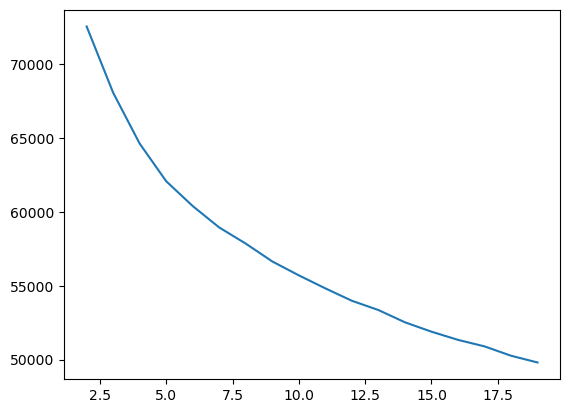

In [133]:
plt.plot(np.arange(2,20),inertias)    #  We cannot find a clear elbow point. The results show a gradual decrease in inertia.
                                # However, if we consider the largest difference, we can choose 4 as the optimal number of clusters.

In [134]:
inertias

[72575.38631594833,
 68084.15565221972,
 64635.18087480252,
 62085.59180156786,
 60402.71090510441,
 58950.92071234604,
 57857.644946978864,
 56648.82161202993,
 55706.91740221982,
 54825.19403216625,
 53984.60084443055,
 53357.30289700029,
 52525.97678563185,
 51890.43854139496,
 51335.57963648353,
 50893.76471802091,
 50260.1176222491,
 49802.84365053279]

In [135]:
labels

[array([1, 1, 1, ..., 1, 0, 0]),
 array([1, 1, 1, ..., 1, 2, 0]),
 array([0, 0, 0, ..., 0, 1, 3]),
 array([1, 3, 3, ..., 3, 2, 4]),
 array([0, 3, 3, ..., 3, 1, 2]),
 array([0, 3, 3, ..., 3, 6, 5]),
 array([4, 6, 6, ..., 6, 3, 5]),
 array([6, 1, 1, ..., 4, 3, 4]),
 array([1, 1, 7, ..., 3, 0, 3]),
 array([1, 8, 8, ..., 0, 3, 0]),
 array([ 2,  2,  4, ...,  3, 11,  3]),
 array([10, 10,  5, ...,  0,  4,  0]),
 array([ 3,  3,  7, ...,  0, 12,  0]),
 array([ 8,  8, 11, ...,  0,  4,  0]),
 array([10, 10,  8, ...,  1,  2,  1]),
 array([14, 14,  4, ...,  8, 16,  8]),
 array([ 3,  3,  9, ..., 10,  5, 10]),
 array([12, 12,  8, ..., 13,  1, 13])]

In [136]:
# Calculate the silhouette score to measure how well the clusters are separated
silhouette_scores = []
for label in labels:
    score = silhouette_score(scaled_df_dummy_k, label)
    silhouette_scores.append(score)


In [137]:
silhouette_scores    # According to this score, the number of clusters should be 2. 
                     # The value closest to 1 is the best. But they are all too far away.
                     # I don't think it will give the right result.

[0.13800430399839386,
 0.10924751460683715,
 0.10154412404987695,
 0.08730318423100493,
 0.0831716794244782,
 0.0806504859860469,
 0.07271180356294636,
 0.07703435364418657,
 0.07291863714416624,
 0.06692141766874558,
 0.07470377225768188,
 0.0695264553458882,
 0.06964233674009102,
 0.06913929991537887,
 0.06666504716691254,
 0.06158891364717655,
 0.06884038062464848,
 0.06018692511742056]

In [138]:
k_means = KMeans(n_clusters = 4, n_init = 10)
k_means.fit(scaled_df_dummy_k)
labels = k_means.labels_

In [139]:
scaled_df_dummy_k['kmeans_clus'] = labels
scaled_df_dummy_k.head(10)

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,...,Gender_Male,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single,Complain_1,kmeans_clus
0,-0.738326,-1.179415,0.093255,-0.911765,-0.772992,1.883200,-1.319620,-0.330738,-1.003537,0.199074,...,0,0,1,0,0,0,0,1,1,1
1,-0.133669,-0.931872,0.093255,0.363573,-0.048392,1.097923,-0.178995,-1.543014,-1.003537,-1.324146,...,1,0,0,1,0,0,0,1,1,1
2,-0.133669,1.791107,-1.333444,0.363573,-0.048392,0.705285,-0.464151,-1.543014,-1.003537,-0.410214,...,1,0,0,1,0,0,0,1,1,1
3,-1.222052,-0.065469,-1.333444,0.363573,1.400807,1.490562,2.102255,-1.543014,-1.003537,-0.410214,...,1,0,1,0,0,0,0,1,0,1
4,-1.222052,-0.436785,0.093255,-0.911765,1.400807,-0.472631,-1.319620,-0.330738,-1.003537,-0.410214,...,1,0,0,1,0,0,0,1,0,1
5,-1.222052,0.800933,0.093255,1.638912,1.400807,-0.865269,1.817099,0.881538,3.374883,0.808362,...,0,0,0,0,1,0,0,1,1,3
6,-0.133669,-0.560556,-1.333444,-0.911765,-0.772992,-0.079992,-0.464151,-1.543014,-1.003537,-1.324146,...,1,0,1,0,0,0,0,0,0,1
7,-0.133669,-1.179415,0.093255,-0.911765,-0.772992,-0.472631,0.106161,0.881538,-0.127853,-1.324146,...,1,0,0,1,0,0,0,0,1,0
8,0.350057,-0.808100,0.093255,0.363573,-0.048392,-0.865269,-0.464151,-1.543014,-1.003537,-0.714858,...,1,0,0,1,0,0,0,0,1,1
9,-0.133669,1.914879,-1.333444,1.638912,-0.048392,-0.865269,-1.034464,-0.330738,-1.003537,-1.019502,...,1,0,0,1,0,0,0,1,0,1


In [140]:
grup_median_kmeans = scaled_df_dummy_k.iloc[:,:].groupby('kmeans_clus').mean()
grup_median_kmeans['freq'] = scaled_df_dummy_k.kmeans_clus.value_counts().sort_index()
grup_median_kmeans

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,...,Gender_Male,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single,Complain_1,freq
kmeans_clus,,,,,,,,,,,,,,,,,,,,,
0,-0.571846,0.049833,0.670025,0.593342,0.025296,0.003071,0.156641,0.400585,0.057398,-0.324539,...,0.620213,0.003766,0.342750,0.038920,0.551789,0.001883,0.489014,0.367232,0.298807,1593
1,-0.215525,-0.076449,-0.669185,-0.506536,0.003810,-0.217205,-0.129783,-0.907547,-0.919735,-0.451652,...,0.615054,0.016129,0.394624,0.356989,0.110215,0.020968,0.512903,0.343011,0.281720,1860
2,1.099140,0.070862,0.296185,0.239690,0.046503,0.674977,0.024794,0.286440,0.141764,0.289701,...,0.555941,0.282741,0.239376,0.000867,0.049436,0.120555,0.568083,0.267997,0.303556,1153
3,0.043477,-0.018451,-0.160319,-0.272850,-0.098633,-0.370253,-0.035860,0.702774,1.421697,0.999062,...,0.596680,0.046875,0.482422,0.080078,0.126953,0.081055,0.583984,0.257812,0.248047,1024


In [142]:
df_kmeans = df.copy()

In [143]:
df_kmeans['kmeans_clus'] = scaled_df_dummy_k['kmeans_clus'] 

In [144]:
grup_mean_kmeans = df_kmeans.select_dtypes(exclude = ['object']).groupby('kmeans_clus').mean()
grup_mean_kmeans['freq'] = df_kmeans.kmeans_clus.value_counts().sort_index()
grup_mean_kmeans

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,Avg_cashback_per_order,freq
kmeans_clus,,,,,,,,,,,,,
0,5.376648,15.931576,3.404269,4.180163,3.101695,4.211551,16.177024,1.603264,2.211551,3.281230,163.522285,76.333961,1593
1,8.323118,14.911290,2.465591,3.317742,3.072043,3.650538,15.172581,0.524194,1.095699,2.863978,148.509677,141.629480,1860
2,19.194276,16.101474,3.142238,3.902862,3.130963,5.922810,15.714657,1.509107,2.307892,5.297485,210.527320,99.027783,1153
3,10.464844,15.379883,2.822266,3.500977,2.930664,3.260742,15.501953,1.852539,3.769531,7.625977,171.082031,49.664990,1024


### Building Classification Models

In [145]:
scaled_df_dummy_h.head()
scaled_df_dummy_h.dtypes

Tenure                                   float64
WarehouseToHome                          float64
HourSpendOnApp                           float64
NumberOfDeviceRegistered                 float64
SatisfactionScore                        float64
NumberOfAddress                          float64
OrderAmountHikeFromlastYear              float64
CouponUsed                               float64
OrderCount                               float64
DaySinceLastOrder                        float64
CashbackAmount                           float64
Avg_cashback_per_order                   float64
Churn_1                                    int64
PreferredLoginDevice_Mobile Phone          int64
PreferredLoginDevice_Phone                 int64
CityTier_2                                 int64
CityTier_3                                 int64
PreferredPaymentMode_COD                   int64
PreferredPaymentMode_Cash on Delivery      int64
PreferredPaymentMode_Credit Card           int64
PreferredPaymentMode

In [152]:
scaled_df_dummy_h['clusters'] = scaled_df_dummy_h['clusters'].astype('object')   # Kumeler is of type int32 but it is a categorical variable, so let's convert it to the appropriate data type

In [153]:
scaled_df_dummy_h.head()

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,...,Gender_Male,PreferedOrderCat_Grocery,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single,Complain_1,clusters
0,-0.738326,-1.179415,0.093255,-0.911765,-0.772992,1.883200,-1.319620,-0.330738,-1.003537,0.199074,...,0,0,1,0,0,0,0,1,1,4
1,-0.133669,-0.931872,0.093255,0.363573,-0.048392,1.097923,-0.178995,-1.543014,-1.003537,-1.324146,...,1,0,0,1,0,0,0,1,1,4
2,-0.133669,1.791107,-1.333444,0.363573,-0.048392,0.705285,-0.464151,-1.543014,-1.003537,-0.410214,...,1,0,0,1,0,0,0,1,1,4
3,-1.222052,-0.065469,-1.333444,0.363573,1.400807,1.490562,2.102255,-1.543014,-1.003537,-0.410214,...,1,0,1,0,0,0,0,1,0,4
4,-1.222052,-0.436785,0.093255,-0.911765,1.400807,-0.472631,-1.319620,-0.330738,-1.003537,-0.410214,...,1,0,0,1,0,0,0,1,0,4


In [154]:
scaled_df_dummy_h.dtypes

Tenure                                   float64
WarehouseToHome                          float64
HourSpendOnApp                           float64
NumberOfDeviceRegistered                 float64
SatisfactionScore                        float64
NumberOfAddress                          float64
OrderAmountHikeFromlastYear              float64
CouponUsed                               float64
OrderCount                               float64
DaySinceLastOrder                        float64
CashbackAmount                           float64
Avg_cashback_per_order                   float64
Churn_1                                    int64
PreferredLoginDevice_Mobile Phone          int64
PreferredLoginDevice_Phone                 int64
CityTier_2                                 int64
CityTier_3                                 int64
PreferredPaymentMode_COD                   int64
PreferredPaymentMode_Cash on Delivery      int64
PreferredPaymentMode_Credit Card           int64
PreferredPaymentMode

In [155]:
scaled_h = pd.get_dummies(scaled_df_dummy_h, drop_first = True, dtype = 'float64')   # one hot encoding for clusters column


In [156]:
scaled_h.head()

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,...,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single,Complain_1,clusters_2,clusters_3,clusters_4
0,-0.738326,-1.179415,0.093255,-0.911765,-0.772992,1.883200,-1.319620,-0.330738,-1.003537,0.199074,...,1,0,0,0,0,1,1,0.0,0.0,1.0
1,-0.133669,-0.931872,0.093255,0.363573,-0.048392,1.097923,-0.178995,-1.543014,-1.003537,-1.324146,...,0,1,0,0,0,1,1,0.0,0.0,1.0
2,-0.133669,1.791107,-1.333444,0.363573,-0.048392,0.705285,-0.464151,-1.543014,-1.003537,-0.410214,...,0,1,0,0,0,1,1,0.0,0.0,1.0
3,-1.222052,-0.065469,-1.333444,0.363573,1.400807,1.490562,2.102255,-1.543014,-1.003537,-0.410214,...,1,0,0,0,0,1,0,0.0,0.0,1.0
4,-1.222052,-0.436785,0.093255,-0.911765,1.400807,-0.472631,-1.319620,-0.330738,-1.003537,-0.410214,...,0,1,0,0,0,1,0,0.0,0.0,1.0


### Addressing Possible Imbalances in the Data and Resampling Using SMOTE

In [157]:
X1 = scaled_h.drop(['Churn_1'], axis = 1)   # Features (Predictor)
y1 = scaled_h['Churn_1']                    # Target 

In [158]:
from imblearn.over_sampling import SMOTE      # Let's address imbalances in the data set and reduce the likelihood of minority groups being ignored.
smt = SMOTE(random_state = 33)
X_res, y_res = smt.fit_resample(X1, y1.ravel())    # Resambling

In [159]:
y_res = pd.DataFrame(y_res)
y_res.columns = ['Churn_1']

In [160]:
scaled_h_smt=pd.concat([X_res,y_res],axis = 1)   # Let's combine the resampled features and the target variable to prepare our dataset for modeling.

### Train Test Split

In [161]:
from sklearn.model_selection import train_test_split

In [162]:
X = scaled_h_smt.drop(['Churn_1'],axis = 1)   
y = scaled_h_smt['Churn_1']
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.75,random_state = 42)   # Let's separate the data to train the model and the data to test it

In [163]:
scaled_h_smt.head()

,Tenure,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,...,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_Others,MaritalStatus_Married,MaritalStatus_Single,Complain_1,clusters_2,clusters_3,clusters_4,Churn_1
0,-0.738326,-1.179415,0.093255,-0.911765,-0.772992,1.883200,-1.319620,-0.330738,-1.003537,0.199074,...,0,0,0,0,1,1,0.0,0.0,1.0,1
1,-0.133669,-0.931872,0.093255,0.363573,-0.048392,1.097923,-0.178995,-1.543014,-1.003537,-1.324146,...,1,0,0,0,1,1,0.0,0.0,1.0,1
2,-0.133669,1.791107,-1.333444,0.363573,-0.048392,0.705285,-0.464151,-1.543014,-1.003537,-0.410214,...,1,0,0,0,1,1,0.0,0.0,1.0,1
3,-1.222052,-0.065469,-1.333444,0.363573,1.400807,1.490562,2.102255,-1.543014,-1.003537,-0.410214,...,0,0,0,0,1,0,0.0,0.0,1.0,1
4,-1.222052,-0.436785,0.093255,-0.911765,1.400807,-0.472631,-1.319620,-0.330738,-1.003537,-0.410214,...,1,0,0,0,1,0,0.0,0.0,1.0,1


### Logistic Regression 
- PSince our problem is a classification problem and logistic regression is a popular algorithm for classification.
- we will train our model and evaluate the results.

### Model Training

In [164]:
log_reg = LogisticRegression(max_iter=1000)  # Create a model object with maximum iteration set to 1000
log_reg.fit(X_train, y_train)                 # Fit the model to the training data


LogisticRegression(max_iter=1000)

### Test and Train Prediction

In [165]:
y_train_pred = log_reg.predict(X_train)   # Predicting on the training set using the trained model
y_test_pred = log_reg.predict(X_test)     # Similarly, making predictions on the test set


### Class Probabilities

In [166]:
# Predicting class probabilities for each class
train_probs = log_reg.predict_proba(X_train)[:, 1]   # Selecting probabilities for Class 1
test_probs = log_reg.predict_proba(X_test)[:, 1]

# Explanation:
# - log_reg.predict_proba() returns an array of class probabilities for each instance
# - [:, 1] selects the probabilities for Class 1

# Usage:
# - Class probabilities provide insight into the likelihood of an instance belonging to each class
# - They can be used to assess confidence or uncertainty in predictions
# - When evaluating classification models, probabilities can be used to determine the positive and 
# - negative class based on a threshold (e.g., 0.5) when plotting the ROC curve
 

### Model Accuracy

In [167]:
# Model Accuracy : Gives the percentage of correctly classified examples on the training data.
log_reg.score(X_train, y_train)

0.837391428164602

In [168]:
log_reg.score(X_test, y_test)

0.8316958564715934

### AUC Score and ROC Curve (Training Data)

AUC Value: 0.919


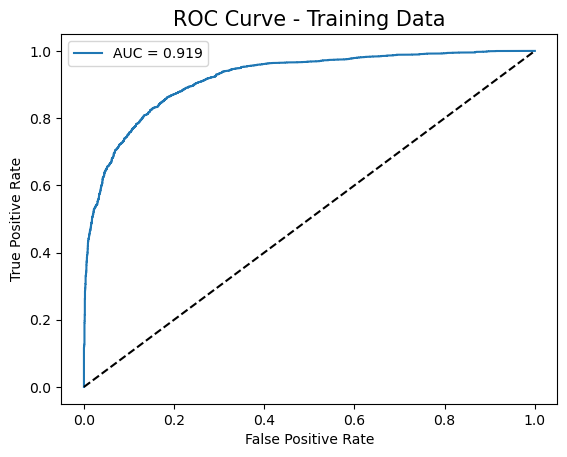

In [169]:
# Let's calculate the AUC value. We measure the classification performance by calculating the area under the ROC curve.
# AUC value close to 1 indicates good model performance. Close to 0.5 indicates an ineffective model. Below 0.5 is undesirable.
# It calculates the TPR and FPR values for different threshold values. AUC is calculated using TPR and FPR under the ROC curve.
AUC = roc_auc_score(y_train, train_probs)
print(f'AUC Value: {AUC:.3f}')

# Let's create the ROC curve.
# roc_curve(y_train = True labels and train_probs = Class probabilities, calculates True Positive Rate, False Positive Rate, and Threshold values.)
# train_fpr and train_tpr contain the TPR and FPR values at different threshold values.

train_fpr, train_tpr, train_thr = roc_curve(y_train, train_probs)

plt.plot(train_fpr, train_tpr, label='AUC = %0.3f' % AUC)     # Displays the AUC value with 3 decimal places on the top left corner.
plt.plot(train_fpr, train_fpr, linestyle='--', color='k')    # Draws a dashed line from one end to the other end of the curve.
plt.xlabel('False Positive Rate')                             # X-axis label
plt.ylabel('True Positive Rate')                              # Y-axis label
plt.title('ROC Curve - Training Data', size=15)               # Graph title
plt.legend()                                                  # Displays legends


### AUC Score and ROC Curve (Test Data)

AUC Value: 0.906


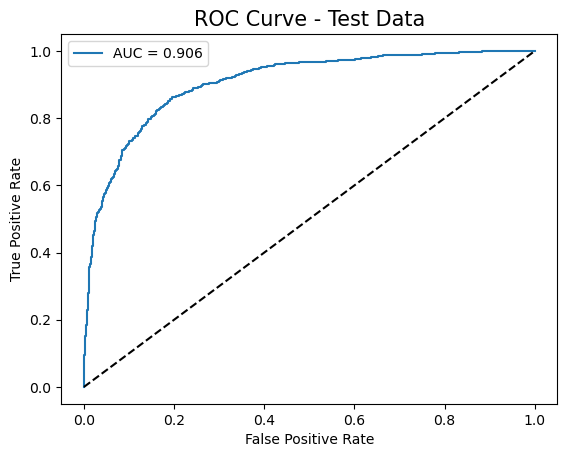

In [170]:
# The explanations we made for the training data also apply here.

AUC = roc_auc_score(y_test, test_probs)
print(f'AUC Value: {AUC:.3f}')

test_fpr, test_tpr, test_thr = roc_curve(y_test, test_probs)

plt.plot(test_fpr, test_tpr, label='AUC = %0.3f' % AUC)       # Displays the AUC value with 3 decimal places on the top left corner.
plt.plot(test_fpr, test_fpr, linestyle='--', color='k')       # Draws a dashed line from one end to the other end of the curve (representing the Random Classifier).
plt.xlabel('False Positive Rate')                              # X-axis label
plt.ylabel('True Positive Rate')                               # Y-axis label
plt.title('ROC Curve - Test Data', size=15)                    # Graph title
plt.legend()                                                   # Displays legends


### Confusion Matrix (Karışıklık Matrisi) - Training Data

Text(0.5, 1.0, 'Logistic Regression Model Accuracy (Training): 0.837391428164602')

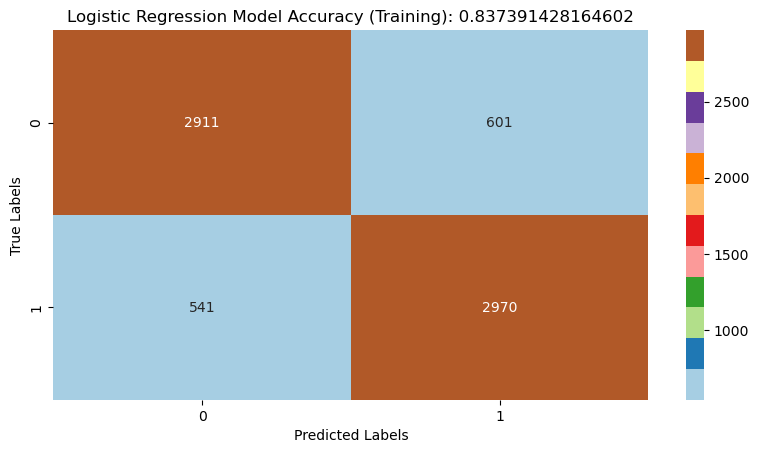

In [171]:
# Let's calculate the confusion matrix for the training data. It can also be referred to as an error matrix.
# It shows the model's performance in classification problems and provides insights into the errors made.
# We can see how well the classifier predicts each class and the mistakes it makes.
# Using the confusion matrix:
# [Accuracy: (TP + TN) / (TP + TN + FP + FN)]   # The ratio of correct predictions to the total dataset
# [Precision: TP / (TP + FP)]                   # The ratio of true positive predictions to the total positive predictions / Success rate of positive predictions
# [Specificity: TN / (TN + FP)]                  # The ratio of true negatives to the sum of true negatives and false positives
# [Recall: TP / (TP + FN)]                       # The ratio of true positives to the sum of true negatives and positives / The rate of correct predictions for the positive class
# [F1 Score: 2 * (Precision * Recall) / (Precision + Recall)]   # Performance metric

log_reg_cfm_tr = confusion_matrix(y_train, y_train_pred)             # Takes the true labels and predicted labels.
plt.figure(figsize=plt.figaspect(0.5))
sns.heatmap(data=log_reg_cfm_tr, annot=True, fmt='d', cmap='Paired')
plt.ylabel('True Labels')
plt.xlabel('Predicted Labels')
title = f'Logistic Regression Model Accuracy (Training): {log_reg.score(X_train, y_train)}'
plt.title(title)


### Test Data

Text(0.5, 1.0, 'Logistic Regression Model Accuracy (Test): 0.8316958564715934')

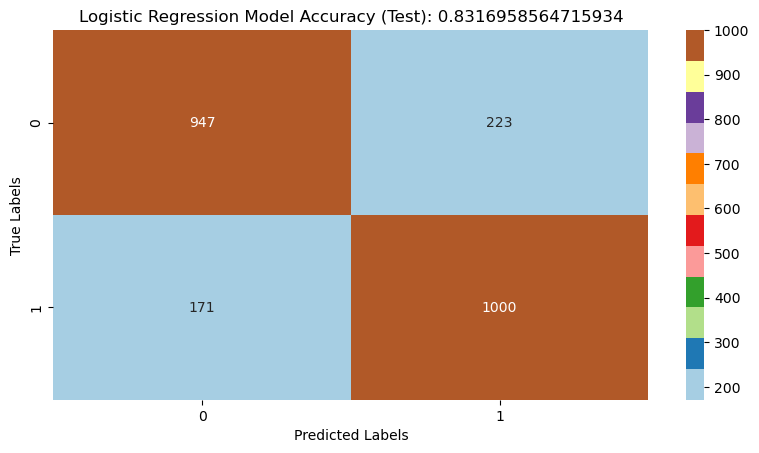

In [173]:
log_reg_cfm_tst = confusion_matrix(y_test, y_test_pred)

plt.figure(figsize=plt.figaspect(0.5))
sns.heatmap(data=log_reg_cfm_tst, annot=True, fmt='d', cmap='Paired')
plt.ylabel('True Labels')
plt.xlabel('Predicted Labels')
title = f'Logistic Regression Model Accuracy (Test): {log_reg.score(X_test, y_test)}'
plt.title(title)


### Model Performance 

In [176]:
# F1 score is calculated per class. We need to combine them in some way for an overall F1 score.
# average = 'micro' : Identical to the F1 score formula. But [TP / (TP + 0.5 x (FP + FN))] : TP,FP, and FN are total values for all classes.
# average = 'macro' : The unweighted mean of the F1 scores calculated per class. So, add the F1s and divide by the number of classes.
# While micro gives equal importance to each observation, macro gives equal importance to each class.
# If the data set is unbalanced, micro gives a bad result. The performance of minority classes is hidden, and the majority are strengthened.
# We will choose micro. Because we don't have class imbalance. We will also choose micro for the other scores.
# Log loss: A metric we evaluate for success and optimization. A metric that measures the deviation of the estimated from the actual. It is good to be low.
# Jaccard Similarity: A measure of how similar two sets are to each other. Simply put, it is (number of intersection elements / number of union elements).
def model_eval(model):
    model_name = model.__class__.__name__
    # Predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # For Training Data
    f1_score_train = f1_score(y_train, y_train_pred, average = 'micro')
    precision_train = precision_score(y_train,y_train_pred,average = 'micro')
    recall_train = recall_score(y_train,y_train_pred,average = 'micro')
    jac_score_train = jaccard_score(y_train,y_train_pred,average = 'micro')
    log_loss_train = log_loss(y_train, y_train_pred)
    
    # For Test Data
    f1_score_test = f1_score(y_test, y_test_pred, average = 'micro')
    precision_test = precision_score(y_test, y_test_pred, average = 'micro')
    recall_test = recall_score(y_test, y_test_pred, average = 'micro')
    jac_score_test = jaccard_score(y_test, y_test_pred, average = 'micro')
    log_loss_test = log_loss(y_test, y_test_pred)

    #Training
    print(f'Model Name :  {model_name} \n')
    print(f'Accuracy Score for Training Data :  {model.score(X_train, y_train)} \n')
    print(f'F-1 Score for Training Data :  {f1_score_train } \n ')
    print(f'Precision Score for Training Data :  {precision_train} \n')
    print(f'Recall Score for Training Data : {recall_train} \n')
    print(f'Jaccard Score for Training Data :  {jac_score_train} \n')
    print(f'Log-Loss Score for Training Data :  {log_loss_train} \n')
    
    #Test
    print(f'Model Name :  {model_name}\n')
    print(f'Accuracy Score for Test Data :  {model.score(X_test, y_test)} \n')
    print(f'F-1 Score for Test Data :  {f1_score_test} \n')
    print(f'Precision Score for Test Data :  {precision_test} \n')
    print(f'Recall Score for Test Data :  {recall_test} \n')
    print(f'Jaccard Score for Test Data : {jac_score_test} \n ')
    print(f'Log-Loss Score for Test Data : {log_loss_test} \n')


In [177]:
model_eval(log_reg)

Model Name :  LogisticRegression 

Accuracy Score for Training Data :  0.837391428164602 

F-1 Score for Training Data :  0.837391428164602 
 
Precision Score for Training Data :  0.837391428164602 

Recall Score for Training Data : 0.837391428164602 

Jaccard Score for Training Data :  0.720269442743417 

Log-Loss Score for Training Data :  5.861007001334442 

Model Name :  LogisticRegression

Accuracy Score for Test Data :  0.8316958564715934 

F-1 Score for Test Data :  0.8316958564715934 

Precision Score for Test Data :  0.8316958564715934 

Recall Score for Test Data :  0.8316958564715934 

Jaccard Score for Test Data : 0.7118829981718464 
 
Log-Loss Score for Test Data : 6.066296213290115 



### Models
- Support Vector Machine (SVM)
- Decision Tree
- Random Forest
- KNN Model
- XGBoost

### Cross Validation

In [178]:
def cross_val(model):
    
    val_score = cross_val_score(model, X, y, cv=5, scoring='accuracy')
    avg_score = val_score.mean()
    print(f' \n Cross-Validation Score : {avg_score}')


### Suppor Vector Machine

In [328]:
'''
tahminleyici_svm = SVC()

parametreler_svm = {'C': [0.1,1, 10, 100],
                   'gamma': [1,0.1,0.01,0.001],
                   'kernel': ['rbf', 'poly', 'sigmoid']
                  }

grid_search_svm = GridSearchCV(estimator=tahminleyici_svm, param_grid=parametreler_svm, cv=5, verbose=True)
grid_search_svm.fit(X_train, y_train)
grid_search_svm.best_params_
'''

"\ntahminleyici_svm = SVC()\n\nparametreler_svm = {'C': [0.1,1, 10, 100],\n                   'gamma': [1,0.1,0.01,0.001],\n                   'kernel': ['rbf', 'poly', 'sigmoid']\n                  }\n\ngrid_search_svm = GridSearchCV(estimator=tahminleyici_svm, param_grid=parametreler_svm, cv=5, verbose=True)\ngrid_search_svm.fit(X_train, y_train)\ngrid_search_svm.best_params_\n"

In [179]:
svm_model = svm.SVC(probability = True, C = 100, gamma = 0.1, kernel = 'rbf')
svm_model.fit(X_train, y_train)

SVC(C=100, gamma=0.1, probability=True)

### Decision Tree

In [180]:
'''
tahminleyici_rf = DecisionTreeClassifier(random_state=1024)
parametreler_dt = {'max_features': ['sqrt', 'log2'],
              'ccp_alpha': [0.1, .01, .001],
              'max_depth' : [5, 6, 7, 8, 9],
              'criterion' :['gini', 'entropy']
             }
grid_search_dt = GridSearchCV(estimator=tahminleyici_rf, param_grid=parametreler_dt, cv=5, verbose=True)
grid_search_dt.fit(X_train, y_train)
grid_search_dt.best_params_
'''

"\ntahminleyici_rf = DecisionTreeClassifier(random_state=1024)\nparametreler_dt = {'max_features': ['sqrt', 'log2'],\n              'ccp_alpha': [0.1, .01, .001],\n              'max_depth' : [5, 6, 7, 8, 9],\n              'criterion' :['gini', 'entropy']\n             }\ngrid_search_dt = GridSearchCV(estimator=tahminleyici_rf, param_grid=parametreler_dt, cv=5, verbose=True)\ngrid_search_dt.fit(X_train, y_train)\ngrid_search_dt.best_params_\n"

In [181]:
dec_tree_model = DecisionTreeClassifier() 
dec_tree_model.fit(X_train, y_train)

DecisionTreeClassifier()

### Random Forest


In [182]:
'''
tahminleyici_rf = RandomForestClassifier()

parametreler_rf = { 
    'n_estimators': [100, 200, 500],
    'max_features': ['sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy'] }
grid_search_rf = GridSearchCV(estimator = tahminleyici_rf, param_grid = parametreler_rf, cv = 5)
grid_search_rf.fit(X_train, y_train)
grid_search_rf.best_params_
'''
# Çıktı : n_estimators = 200, criterion = 'gini', max_features = 'log2', max_depth = 8

"\ntahminleyici_rf = RandomForestClassifier()\n\nparametreler_rf = { \n    'n_estimators': [100, 200, 500],\n    'max_features': ['sqrt', 'log2'],\n    'max_depth' : [4,5,6,7,8],\n    'criterion' :['gini', 'entropy'] }\ngrid_search_rf = GridSearchCV(estimator = tahminleyici_rf, param_grid = parametreler_rf, cv = 5)\ngrid_search_rf.fit(X_train, y_train)\ngrid_search_rf.best_params_\n"

In [183]:
ran_for_model = RandomForestClassifier(random_state = 42)
ran_for_model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

### XGBoost

In [184]:
 '''
tahminleyici_xgb = XGBClassifier()

parametreler_xgb = {
    'n_estimators': range(100, 220,20),     
    'max_depth': range(2,10,1),
    'learning_rate': [0.1, 0.01, 0.05],
    'gamma': [0, 0.1, 0.2]
}

# GridSearch ile en uygun parametreleri buluyoruz.
grid_search_xgb = GridSearchCV(tahminleyici_xgb, parametreler_xgb, cv = 5)  # 5-fold cross-val 
grid_search_xgb.fit(X_train, y_train)

print(grid_search_xgb.best_params_)
'''
# Çıktı : gamma = 0,learning_rate = 0.1, max_depth = 9, n_estimators = 200


"\ntahminleyici_xgb = XGBClassifier()\n\nparametreler_xgb = {\n   'n_estimators': range(100, 220,20),     \n   'max_depth': range(2,10,1),\n   'learning_rate': [0.1, 0.01, 0.05],\n   'gamma': [0, 0.1, 0.2]\n}\n\n# GridSearch ile en uygun parametreleri buluyoruz.\ngrid_search_xgb = GridSearchCV(tahminleyici_xgb, parametreler_xgb, cv = 5)  # 5-fold cross-val \ngrid_search_xgb.fit(X_train, y_train)\n\nprint(grid_search_xgb.best_params_)\n"

In [185]:
xgb_model = XGBClassifier(gamma = 0,learning_rate = 0.1, max_depth = 9, n_estimators = 200)
xgb_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=9, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=200, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

## Test and Training Data Predictions

### AUC VE ROC Train and Test

In [336]:

def auc_roc_maker(model):
    fig, axs = plt.subplots(1, 2, figsize = (15, 5)) # Let's create our subplots as 1x2

    train_probs = model.predict_proba(X_train)[:, 1]
    test_probs = model.predict_proba(X_test)[:, 1]
    
    auc_train = roc_auc_score(y_train, train_probs)
    auc_test = roc_auc_score(y_test, test_probs)
    
    train_fpr, train_tpr, train_thr = roc_curve(y_train, train_probs)
    test_fpr, test_tpr, test_thr = roc_curve(y_test, test_probs)

    # Training 
    axs[0].plot(train_fpr, train_tpr, label = 'AUC = %0.3f' % auc_train)
    axs[0].plot(train_fpr, train_fpr, linestyle='--', color='k',label = model.__class__.__name__)
    axs[0].set_xlabel('False Positive Rate')
    axs[0].set_ylabel('True Positive Rate')
    axs[0].set_title('Training Data ROC Curve', size = 12)
    axs[0].legend(loc='lower right')
    
    # Test
    axs[1].plot(test_fpr, test_tpr, label= ['AUC = %0.3f' % auc_test , model.__class__.__name__])
    axs[1].plot(test_fpr, test_fpr, linestyle='--', color = 'k')
    axs[1].set_xlabel('False Positive Rate')
    axs[1].set_ylabel('True Positive Rate')
    axs[1].set_title('Test Data ROC Curve', size = 12)
    axs[1].legend(loc = 'lower right')

    plt.tight_layout() 
    plt.show()

    print(f'AUC Score for Training Data: {auc_train :.3f}')
    print(f'AUC Score for Test Data: {auc_test :.3f}')



In [337]:
def cfm_maker(model):
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))  # Again as it was in roc, it's 1x2 and same size.
    
    # Predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # cfm Calculation
    cfm_train = confusion_matrix(y_train, y_train_pred)
    cfm_test = confusion_matrix(y_test, y_test_pred)

    # Training    
    sns.heatmap(cfm_train, annot = True, fmt = 'd', cmap = 'Paired', ax = axes[0])
    axes[0].set_xlabel('Predicted Labels')
    axes[0].set_ylabel('Actual Labels')
    axes[0].set_title(f'Confusion Matrix for Training Data\nAccuracy Rate : {model.score(X_train, y_train):.3f}')

    # Test
    sns.heatmap(cfm_test, annot = True, fmt='d', cmap = 'Paired', ax = axes[1])
    axes[1].set_xlabel('Predicted Labels')
    axes[1].set_ylabel('Actual Labels')
    axes[1].set_title(f'Confusion Matrix for Test Data\Model Accuracy Rate : {model.score(X_test, y_test):.3f}')

    plt.tight_layout()
    plt.show()

In [186]:
# I combined the two functions above. Since there are 6 models, it would be tiring to read, so 4 graphics per model are on one page.

def cfm_roc_maker(model):
    # get the name of the model we will use.
    model_name = model.__class__.__name__

    # Predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Class Probabilities
    train_probs = model.predict_proba(X_train)[0:,1]
    test_probs = model.predict_proba(X_test)[0:,1]

    # Let's calculate the AUC scores
    auc_train = roc_auc_score(y_train, train_probs)
    auc_test = roc_auc_score(y_test, test_probs)

    # Let's calculate the fpr, tpr and threshold values for the ROC curve
    train_fpr, train_tpr, train_thr = roc_curve(y_train, train_probs)
    test_fpr, test_tpr, test_thr = roc_curve(y_test, test_probs)
    
    # Let's make our subplots as 2 rows and 2 columns.
    fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (15, 10))
    fig.subplots_adjust(hspace = 0.4, wspace = 0.4)      # let's adjust the distance between the graphics.

    # Let's calculate the cfm for Training and Test
    cfm_train = confusion_matrix(y_train, y_train_pred)
    cfm_test = confusion_matrix(y_test, y_test_pred)

    # Drawing cfm for Training
    sns.heatmap(data = cfm_train, annot = True, fmt = 'd', cmap = 'Paired', ax = axes[0, 0])
    axes[0, 0].set_ylabel('Actual Labels')    # let's place it in the first cell of the 4 cells
    axes[0, 0].set_xlabel('Predicted Labels')
    axes[0, 0].set_title(f'Confusion Matrix for Training Data \ Model Accuracy Rate : {model.score(X_train, y_train):.3f}')
    
    # Drawing cfm for Test
    sns.heatmap(data = cfm_test, annot = True, fmt = 'd', cmap = 'Paired', ax = axes[0, 1])
    axes[0, 1].set_ylabel('Actual Labels')
    axes[0, 1].set_xlabel('Predicted Labels')
    axes[0, 1].set_title(f'Confusion Matrix for Test Data \ Model Accuracy Rate : {model.score(X_test, y_test):.3f}')
    
    # Drawing ROC for Training
    axes[1, 0].plot(train_fpr, train_tpr, label = ['AUC = %0.3f' % auc_train , model_name])
    axes[1, 0].plot(train_fpr, train_fpr, linestyle = '--', color = 'k')
    axes[1, 0].set_xlabel('False Positive Rate')
    axes[1, 0].set_ylabel('True Positive Rate')
    axes[1, 0].set_title('Training Data ROC Curve')
    axes[1, 0].legend(loc='lower right')

    # Drawing ROC for Test
    axes[1, 1].plot(test_fpr, test_tpr, label = ['AUC = %0.3f' % auc_test , model_name])
    axes[1, 1].plot(test_fpr, test_fpr, linestyle = '--', color = 'k')   #test_fpr,test_fpr to draw a diagonal line
    axes[1, 1].set_xlabel('False Positive Rate')
    axes[1, 1].set_ylabel('True Positive Rate')
    axes[1, 1].set_title('Test Data ROC Curve')
    axes[1, 1].legend(loc='lower right')

    plt.show()


### SUPPORT VECTOR MACHİNE (SVM)

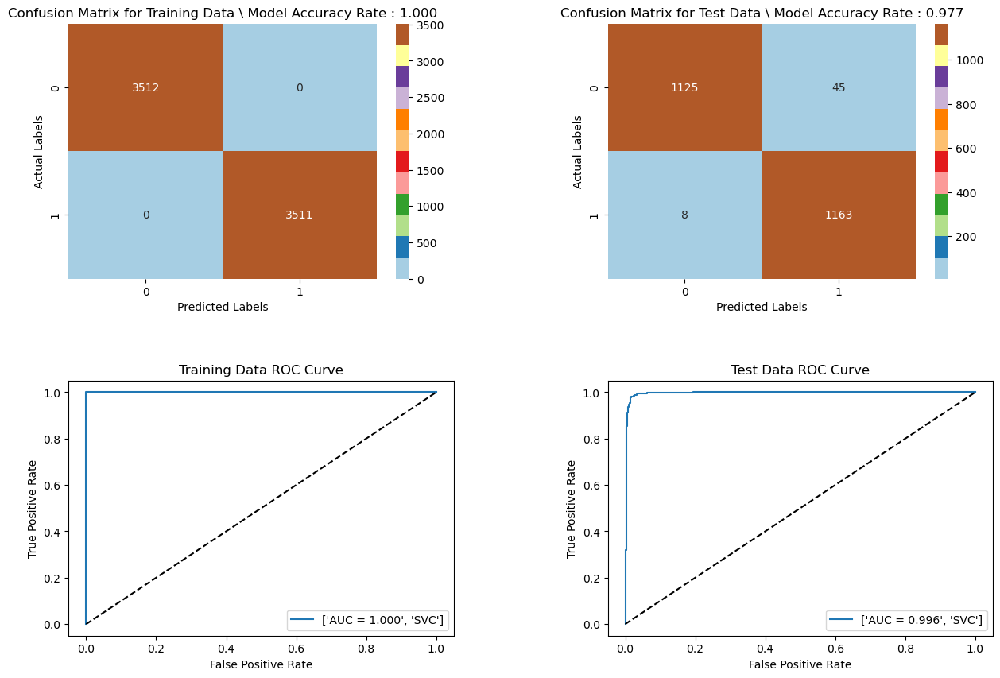

In [187]:
cfm_roc_maker(svm_model)

In [188]:
model_evaluation(svm_model)    
cross_val(svm_model)
# There is a slight difference between the log-losses, perhaps the model may be experiencing a bit more uncertainty on some data groups.
# but our f1-precision and recall scores are above 0.9 and  
# There is not much difference between the scores of training and test data. 
#It doesn't seem to be an overfitting problem.
# GridCV hyperparameter analysis gave very good results.
#The accuracy of our model's predictions increased in both training and test data.


Model Name :  SVC 

Accuracy Score for Training Data :  1.0 

F-1 Score for Training Data :  1.0 
 
Precision Score for Training Data :  1.0 

Recall Score for Training Data : 1.0 

Jaccard Score for Training Data :  1.0 

Log-Loss Score for Training Data :  2.2204460492503136e-16 

Model Name :  SVC

Accuracy Score for Test Data :  0.9773601025202905 

F-1 Score for Test Data :  0.9773601025202905 

Precision Score for Test Data :  0.9773601025202905 

Recall Score for Test Data :  0.9773601025202905 

Jaccard Score for Test Data : 0.9557226399331662 
 
Log-Loss Score for Test Data : 0.8160246175237974 

 
 Cross-Validation Score : 0.9827012631137031




### Before Grid Search : 

Model Name :  SVC 

F-1 Score for Training Data :  0.9491670226398975 
 
Precision Score for Training Data :  0.9491670226398975

Recall Score for Training Data : 0.9491670226398975 

Jaccard Score for Training Data :  0.9032520325203252

Log-Loss Score for Training Data :  1.8322062167043747

Model Name :  SVC

F-1 Score for Test Data :  0.9260999572832123

Precision Score for Test Data :  0.9260999572832123

Recall Score for Test Data :  0.9260999572832123

Jaccard Score for Test Data : 0.862370723945903
 
Log-Loss Score for Test Data : 2.663627525124847
ru : 2.663627525124847


### RANDOM FOREST

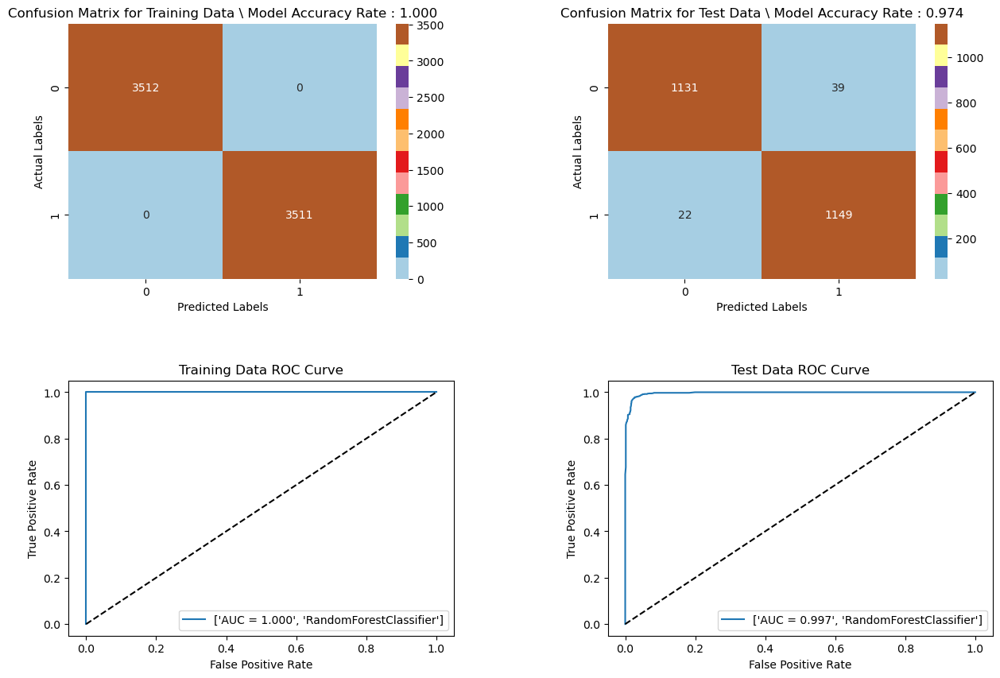

In [189]:
cfm_roc_maker(ran_for_model)

In [192]:
model_eval(ran_for_model) 
cross_val(ran_for_model)

Model Name :  RandomForestClassifier 

Accuracy Score for Training Data :  1.0 

F-1 Score for Training Data :  1.0 
 
Precision Score for Training Data :  1.0 

Recall Score for Training Data : 1.0 

Jaccard Score for Training Data :  1.0 

Log-Loss Score for Training Data :  2.2204460492503136e-16 

Model Name :  RandomForestClassifier

Accuracy Score for Test Data :  0.9739427595044853 

F-1 Score for Test Data :  0.9739427595044853 

Precision Score for Test Data :  0.9739427595044853 

Recall Score for Test Data :  0.9739427595044853 

Jaccard Score for Test Data : 0.9492089925062448 
 
Log-Loss Score for Test Data : 0.9391981446972006 

 
 Cross-Validation Score : 0.9697797878991151


### DECİSİON TREE

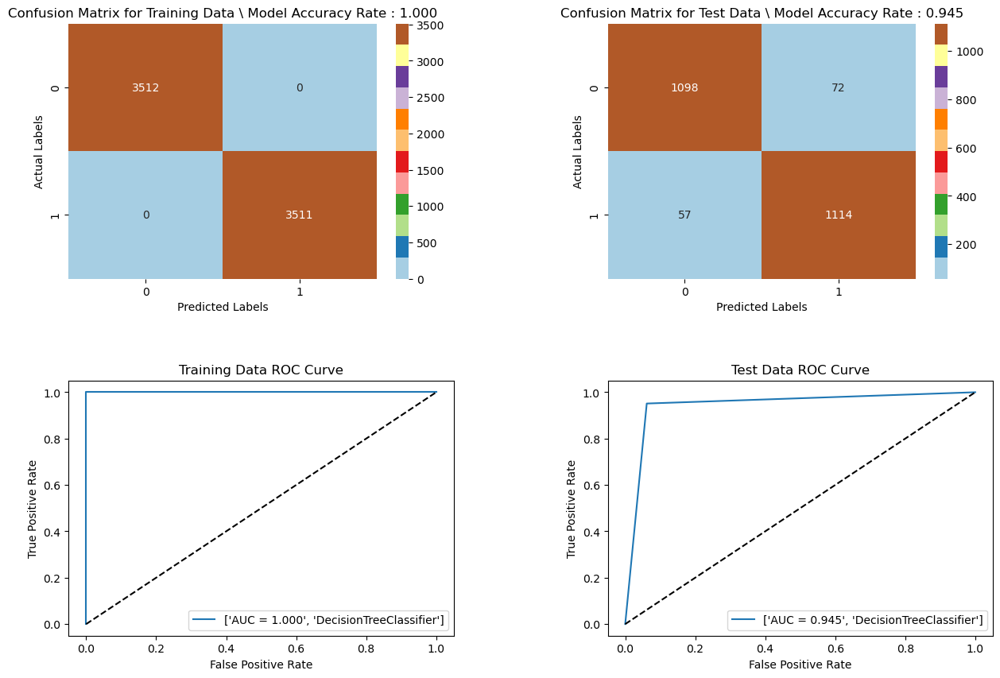

In [193]:
cfm_roc_maker(dec_tree_model)

In [196]:
model_eval(dec_tree_model)
cross_val(dec_tree_model)

Model Name :  DecisionTreeClassifier 

Accuracy Score for Training Data :  1.0 

F-1 Score for Training Data :  1.0 
 
Precision Score for Training Data :  1.0 

Recall Score for Training Data : 1.0 

Jaccard Score for Training Data :  1.0 

Log-Loss Score for Training Data :  2.2204460492503136e-16 

Model Name :  DecisionTreeClassifier

Accuracy Score for Test Data :  0.944895343870141 

F-1 Score for Test Data :  0.944895343870141 

Precision Score for Test Data :  0.944895343870141 

Recall Score for Test Data :  0.944895343870141 

Jaccard Score for Test Data : 0.8955465587044534 
 
Log-Loss Score for Test Data : 1.9861731256711288 

 
 Cross-Validation Score : 0.9265304644041965


### XGBoost

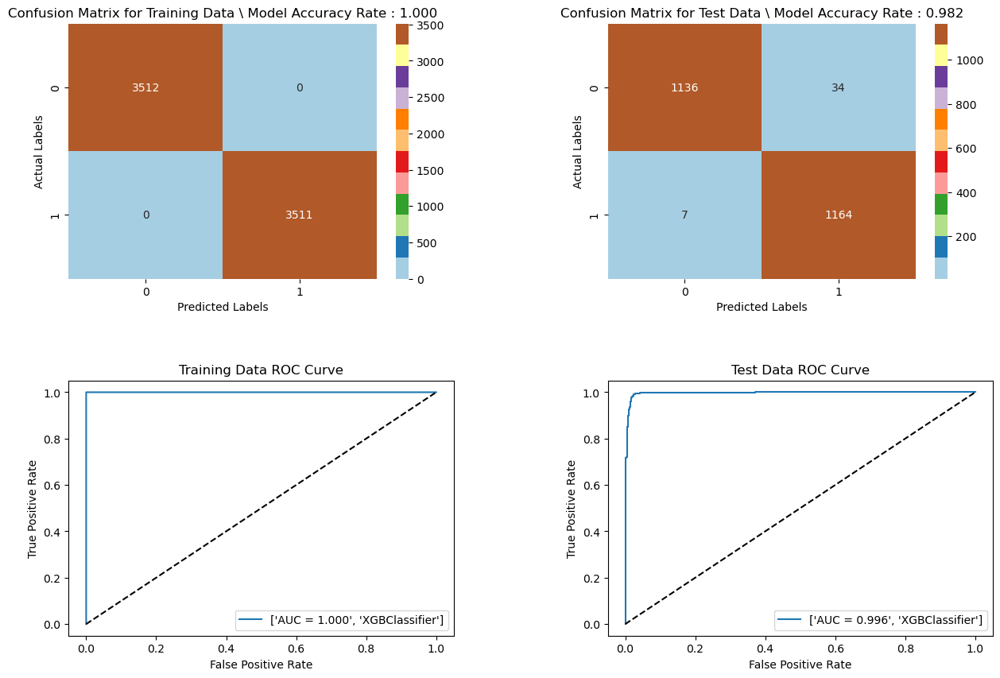

In [197]:
cfm_roc_maker(xgb_model)

In [198]:
model_eval(xgb_model)
cross_val(xgb_model)

Model Name :  XGBClassifier 

Accuracy Score for Training Data :  1.0 

F-1 Score for Training Data :  1.0 
 
Precision Score for Training Data :  1.0 

Recall Score for Training Data : 1.0 

Jaccard Score for Training Data :  1.0 

Log-Loss Score for Training Data :  2.2204460492503136e-16 

Model Name :  XGBClassifier

Accuracy Score for Test Data :  0.9824861170439982 

F-1 Score for Test Data :  0.9824861170439982 

Precision Score for Test Data :  0.9824861170439982 

Recall Score for Test Data :  0.9824861170439982 

Jaccard Score for Test Data : 0.9655751469353484 
 
Log-Loss Score for Test Data : 0.6312643267636924 

 
 Cross-Validation Score : 0.9667907876663883


### Feature İmportance
-  
It is used to use the importance of a feature in predicting the target variable.

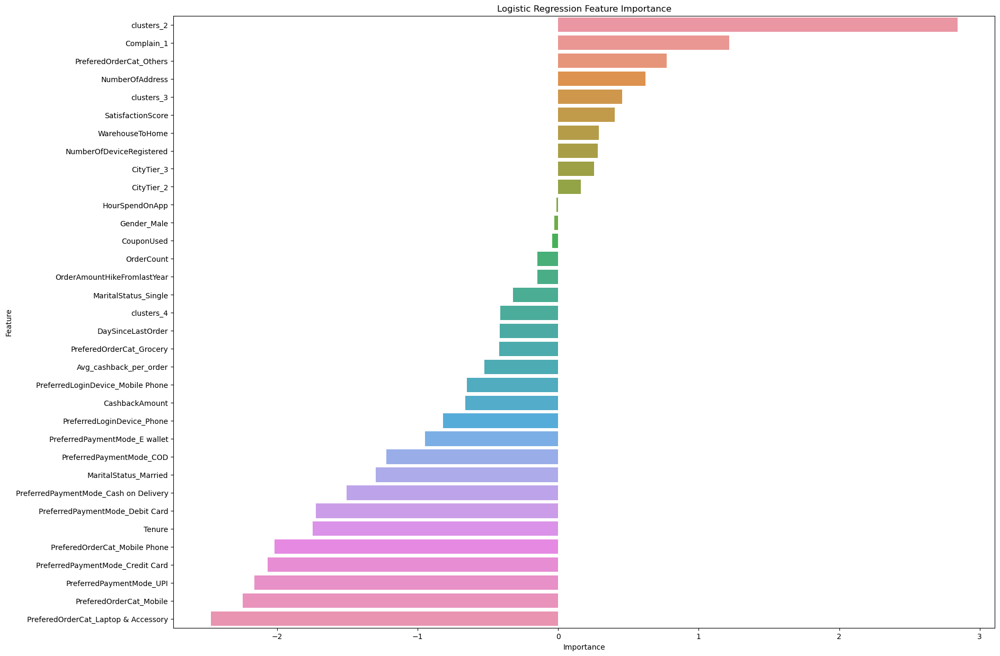

In [199]:
fea_imp = pd.DataFrame({'Feature' : X.columns , 'Importance' : log_reg.coef_[0]})
fea_imp = fea_imp.sort_values('Importance' , ascending=False)
plt.figure(figsize = (20,15))
sns.barplot(x = 'Importance' , y = 'Feature' , data = fea_imp)
plt.title('Logistic Regression Feature Importance')
plt.show()

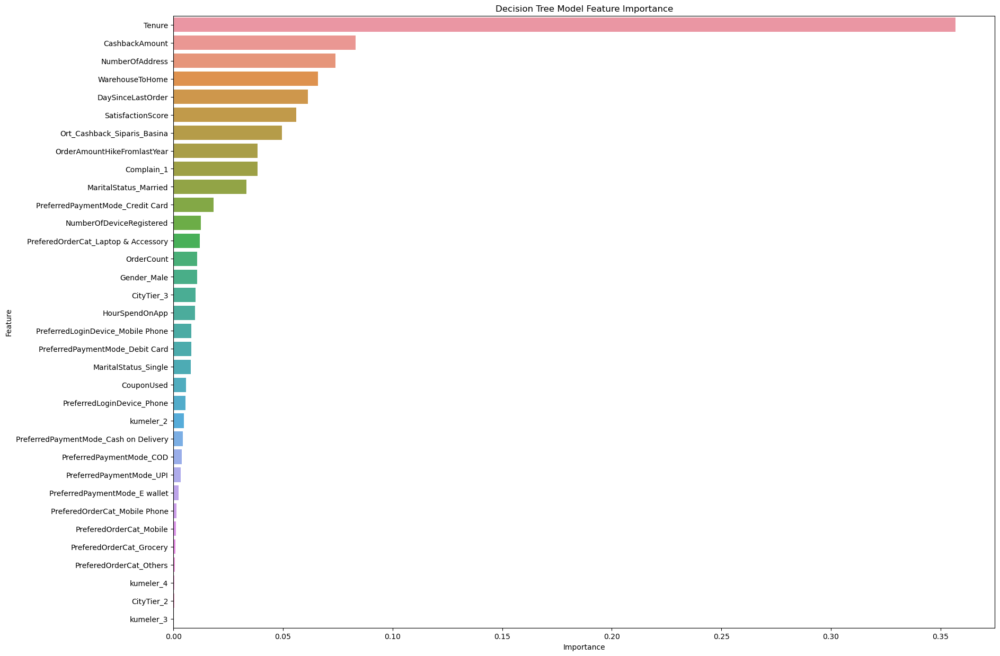

In [348]:
dec_tree_importances = dec_tree_model.feature_importances_
fea_imp = pd.DataFrame({'Feature' : X_train.columns, 'Importance': dec_tree_importances})
fea_imp = fea_imp.sort_values('Importance', ascending = False)
plt.figure(figsize = (20, 15))
sns.barplot(x = 'Importance', y = 'Feature', data = fea_imp)
plt.title("Decision Tree Model Feature Importance")
plt.show()

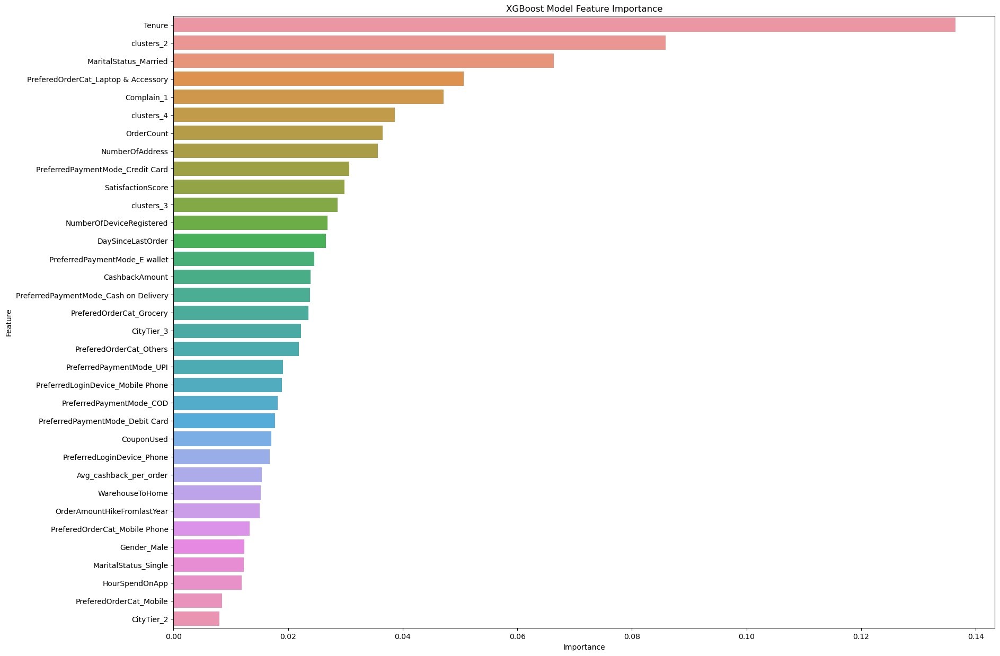

In [200]:
xgb_importances = xgb_model.feature_importances_
fea_imp = pd.DataFrame({'Feature' : X_train.columns, 'Importance': xgb_importances})
fea_imp = fea_imp.sort_values('Importance', ascending = False)
plt.figure(figsize = (20, 15))
sns.barplot(x = 'Importance', y = 'Feature', data = fea_imp)
plt.title("XGBoost Model Feature Importance")
plt.show()

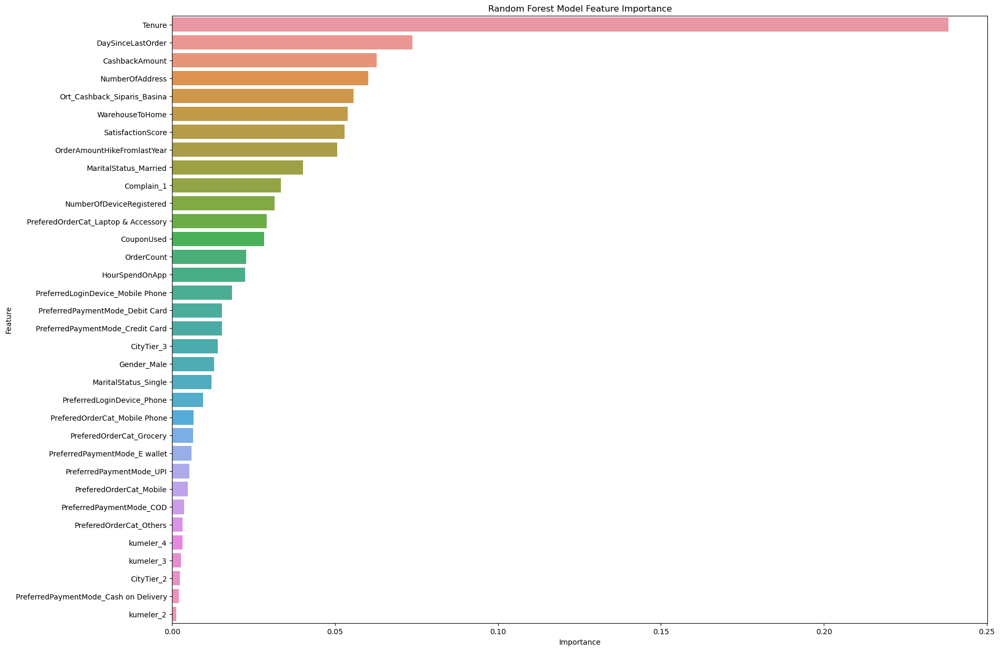

In [350]:
ran_for_importances = ran_for_model.feature_importances_
fea_imp = pd.DataFrame({'Feature' : X_train.columns, 'Importance': ran_for_importances})
fea_imp = fea_imp.sort_values('Importance', ascending = False)
plt.figure(figsize = (20, 15))
sns.barplot(x = 'Importance', y = 'Feature', data = fea_imp)
plt.title("Random Forest Model Feature Importance")
plt.show()

In [201]:
# We can say that the models we have built are successful. There doesn't seem to be an overfitting problem. 
# We applied cross-validation and saw that the accuracy scores of the results were close. 
# There are no significant differences between the scores of the test data and the training data.
# Nevertheless, the scores of the models remain high compared to real situations.
# We might need more data for more accurate results.
# We can see that some of our features might be unnecessary.
# Feature reduction could be done to decrease the complexity of the models.
# Different normalization methods could be utilized.
# With SHAP (SHapley Additive exPlanations) analysis, we can understand how our models work and the reasons behind their predictions. 
# We can study the effects of certain features and optimize our models.
